<a href="https://colab.research.google.com/github/Mateus-AO/AV2-Intro-Dados/blob/main/AV2_IntroDados_MateusAlmeida_GuilhermeWillemen.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Contexto e Motivação

Criamos este projeto para demonstrar, de forma prática e divertida, o potencial do algoritmo Gaussian Mixture Model (GMM). Em vez de ficarmos presos a análises básicas de duas ou três dimensões, decidimos explorar o mundo polidimensional, utilizando características extraídas diretamente de imagens.


<h3>O Pipeline de Dados</h3>
O fluxo do projeto consiste em transformar imagens em vetores matemáticos (embeddings) para analisar a morfologia facial. O processo segue estas etapas:

2. Extração de Features: Utilizamos a rede neural ResNet50 para abstrair as características das imagens, gerando vetores de alta fidelidade com 2048 dimensões.

3. Redução de Dimensionalidade (PCA): Aplicamos o Principal Component Analysis para reduzir essa complexidade, ordenando as características por relevância e mantendo a variância principal do conjunto de dados.

4. Clustering Morfológico: O modelo agrupa as faces animais com base em seus traços, focando na morfologia e na estrutura da face.

5. Análise de Similaridade Humana: Como o rosto humano não pertence nativamente ao conjunto de treino, um hard clustering (que força a escolha de um único grupo) seria impreciso. Por isso, optamos pelo Soft Clustering do GMM, que nos retorna probabilidades e permite uma análise muito mais rica e rigorosa de "quão animal" cada traço humano pode ser.

<h3>Como Executar com sua Imagem</h3>
Para rodar o projeto, siga estes passos:

1. Dataset: Baixe a pasta data/stage2 disponível na [versão de desktop](https://github.com/Mateus-AO/AV2-Intro-Dados) e faça o upload para o diretório stage2 no ambiente do Colab.

2. Input: Faça o upload de uma foto de rosto humano para o Colab.

3. Execução: Insira o caminho do arquivo na seção "Tratamento de imagem / Imagem do Humano" e rode as células.

# Setup

Importação e instalação das bibliotecas utilizadas

In [265]:
try:
  from sklearn.cluster import KMeans
  from sklearn.cluster import AgglomerativeClustering
  from sklearn.metrics.pairwise import cosine_distances
  from sklearn.mixture import GaussianMixture
  from sklearn.cluster import KMeans
  from sklearn.preprocessing import StandardScaler
  from sklearn.decomposition import PCA
  from sklearn.datasets import load_digits, make_blobs
except ImportError:
  !pip install sklearn
  from sklearn.cluster import KMeans
  from sklearn.cluster import AgglomerativeClustering
  from sklearn.metrics.pairwise import cosine_distances
  from sklearn.mixture import GaussianMixture
  from sklearn.cluster import KMeans
  from sklearn.preprocessing import StandardScaler
  from sklearn.decomposition import PCA
  from sklearn.datasets import load_digits, make_blobs

try:
  import cv2
except ImportError:
  !pip install opencv-python
  import cv2

try:
  from scipy.cluster.hierarchy import dendrogram, linkage
except ImportError:
  !pip install scipy
  from scipy.cluster.hierarchy import dendrogram, linkage

try:
  import numpy as np
  import pandas as pd
  import matplotlib.pyplot as plt
  import seaborn as sns
  from mpl_toolkits.mplot3d import Axes3D
  import matplotlib.patches as patches
except ImportError:
  !pip install numpy pandas matplotlib seaborn
  import numpy as np
  import pandas as pd
  import matplotlib.pyplot as plt
  import seaborn as sns
  from mpl_toolkits.mplot3d import Axes3D
  import matplotlib.patches as patches

try:
  import torch
  import torch.nn as nn
  from torchvision import models, transforms
except ImportError:
  !pip install torch torchvision
  import torch
  import torch.nn as nn
  from torchvision import models, transforms

try:
  from PIL import Image
except ImportError:
  !pip install pillow
  from PIL import Image

try:
  import umap
except ImportError:
  !pip install umap-learn
  import umap

from io import BytesIO
import base64
import os
import glob
import altair as alt

from google.colab.patches import cv2_imshow
import random

In [352]:
from google.colab import output
output.enable_custom_widget_manager()
import IPython
IPython.display.display(IPython.display.HTML(""))

# Tratamento de imagem

Todas as imagens utilizadas, incluindo a imagem do humano, devem ser processadas de forma equivalente. Para isso, é realizado o resize para o tamanho 224x224 (valor de leitura do Tensor/Rede Neural), Clahe, blue de mediana, blur bilateral e fechamento morfologico. Sobretudo, removeremos a cor para enfatizar o uso de caracteristicas de morfologia facial.

- Clahe (Contrast Limited Adaptive Histogram Equalization): é uma técnica avançada de processamento de imagem que melhora o contraste local dividindo a imagem em blocos menores ("tiles"), aplicando a equalização de histograma em cada um e limitando o contraste para evitar a amplificação de ruído.

- - [Para saber mais clique aqui](https://docs.opencv.org/4.x/d5/daf/tutorial_py_histogram_equalization.html)


- Blur de Mediana: é uma técnica de processamento digital de imagens utilizada para reduzir ruídos e suavizar imagens, sendo particularmente eficaz na remoção do ruído tipo "salt-and-pepper" (sal e pimenta) — aqueles pontos brancos e pretos aleatórios. Ao contrário de filtros lineares (como o desfoque Gaussiano ou a média), que calculam a média dos pixels vizinhos, o filtro de mediana substitui o valor do pixel central pela mediana de todos os pixels na área do "kernel" (vizinhanca). Uma grande vantagem do filtro de mediana é que ele preserva as bordas (contornos) da imagem melhor do que outros filtros de suavização.

- - [Para saber mais clique aqui](https://docs.gimp.org/3.0/pt_BR/gimp-filter-median-blur.html)


- Filtro Bilateral: é um filtro de suavização não linear , que preserva as bordas e reduz o ruído em imagens . Ele substitui a intensidade de cada pixel por uma média ponderada dos valores de intensidade dos pixels vizinhos. Essa ponderação pode ser baseada em uma distribuição gaussiana. Preserva as bordas nítidas enquanto suprime o ruído.
- - [Para saber mais clique aqui](https://en-wikipedia-org.translate.goog/wiki/Bilateral_filter?_x_tr_sl=en&_x_tr_tl=pt&_x_tr_hl=pt&_x_tr_pto=tc)



- Fechamento Morfologico: é uma operação de processamento de imagens (morfologia matemática) que consiste na dilatação seguida de erosão. Ele é utilizado para preencher pequenos buracos, conectar objetos próximos, suavizar contornos externos e eliminar ruídos escuros.



- - A erosão é uma operação morfológica no processamento de imagens que reduz ou "desgasta" as bordas de objetos brancos (primeiro plano) em uma imagem, geralmente binária
- - [Para saber mais clique aqui](https://docs.opencv.org/3.4/d3/dbe/tutorial_opening_closing_hats.html)

In [266]:
def tratamento_avancado(caminho_imagem):
    # Carregamos usando OpenCV em Grayscale
    img = cv2.imread(caminho_imagem, cv2.IMREAD_GRAYSCALE)

    if img is None: return None

    # CLAHE (Melhorar Contraste Local)
    # clipLimit=2.0 impede que fique com ruído demais
    # tileGridSize=(8,8) divide a imagem em pequenos pedaços para ajustar a luz localmente
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    img_clahe = clahe.apply(img)

    # FILTRO DE MEDIANA (Minimiza a percepção de pelos na imagem)
    # Substitui o pixel pelo valor central da vizinhança
    # Remove fios isolados de pelo sem borrar as bordas principais
    # O kernel deve ser ímpar (5 ou 7 foram as escolhas ideais)
    img_median = cv2.medianBlur(img_clahe, 5)

    # FILTRO BILATERAL (Blur + Sharpen)
    # d=9: Diâmetro da vizinhança (olha 9 pixels em volta)
    # sigmaColor=75: Quão diferente a cor tem que ser para manter a borda
    # sigmaSpace=75: O quanto o blur se espalha geograficamente

    img_bilateral = cv2.bilateralFilter(img_median, d=9, sigmaColor=75, sigmaSpace=75)

    # FECHAMENTO MORFOLOGICO (Unificação de Estrutura)
    # Dilatação seguida de Erosão
    # Isso "fecha" os espaços pretos entre os pelos, criando uma massa sólida
    # É excelente para dar ao animal uma aparência de "estátua" ou "pele lisa"
    kernel = np.ones((3,3), np.uint8)
    img_final = cv2.morphologyEx(img_bilateral, cv2.MORPH_CLOSE, kernel)

    # Neutralizando texturas de pelagem agressivamente
    # img_final = cv2.bilateralFilter(img_final, d=15, sigmaColor=150, sigmaSpace=75)
    img_final = cv2.bilateralFilter(img_final, d=12, sigmaColor=100, sigmaSpace=75)

    # OpenCV usa NumPy, mas o PyTorch usa PIL Image e RGB
    # Transformamos de volta para RGB (copia-se os canais cinzas)
    img_final = cv2.cvtColor(img_final, cv2.COLOR_GRAY2RGB)

    return img_final

In [267]:
def ProcessImageStage2(imgPath, TAMANHO_FINAL=224):
    img = tratamento_avancado(imgPath)

    final = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    h,w = final.shape
    dimFactor = TAMANHO_FINAL/max(w,h) # Fator de resize

    if max(h,w) != TAMANHO_FINAL: # No caso onde a imagem de entrada não foi devidamente tratada
      final = cv2.resize(final, (int(w*dimFactor), int(h*dimFactor)))
      h,w = final.shape
      dimFactor = TAMANHO_FINAL/max(w,h)

    hborder = TAMANHO_FINAL - h*dimFactor
    wborder = TAMANHO_FINAL - w*dimFactor

    final = cv2.resize(final, (int(w/2), int(h/2)))
    final = cv2.resize(final, (int(w), int(h)))

    # O Tensor deverá receber uma imagem 224x244
    # Adicionaremos bordas complementares para a imagem processada ser compativel com o Tensor
    final = cv2.copyMakeBorder(
        final,
        int(hborder//2), int((hborder+1)//2), int(wborder//2), int((wborder+1)//2),
        cv2.BORDER_CONSTANT,
        value=[0] # Preto
    )

    return final

## Imagem do Humano

Iremos utilizar a imagem a seguir:

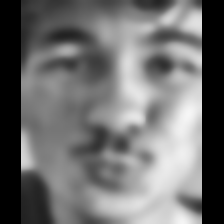

In [268]:
imgHumanPath = "TRATADO_None13.jpg"
imgHuman = ProcessImageStage2(imgHumanPath)

cv2_imshow(imgHuman)

# Construindo Array de caracteristicas

Utilizaremos o conjunto de imagens processadas manualmente utilizando da versão Desktop dessa aplicação, acesso em [github do projeto](https://github.com/Mateus-AO/AV2-Intro-Dados)

Certifiquese de copiar e colar a pasta stage2, acessivel em: [pasta stage2](https://github.com/Mateus-AO/AV2-Intro-Dados/tree/main/data/stage2)

Recomendação: Crie uma pasta no colab chamada de 'stage2' dentro de 'content' (pasta default, aberta automaticamente quando navegado pelo primeira vez na parte de Arquivos) e cole todos os arquivos nela

## Carregando Modelo Resnet50

"Utilizaremos a arquitetura ResNet-50, uma rede neural convolucional profunda disponível na biblioteca Torchvision. O modelo será utilizado em modo de inferência com pesos pré-treinados na base ImageNet, permitindo a extração de vetores de características (embeddings) de alta dimensionalidade para representar a morfologia facial das imagens."

Documentação Oficial: [PyTorch - ResNet50](https://docs.pytorch.org/vision/main/models/generated/torchvision.models.resnet50.html)

Por padrão, o Renet50 foi treinado na base ImageNet-1K, que contém mais de 1.2 milhão de imagens divididas em 1000 categorias diferentes. Com isso, a rede neural busca responder o que uma imagem de entrada representa, e.g. "Essa isso se trata de um Golden Retriever". Porém, buscamos os embeddings da imagem e não a classificação. Para isso, utilizaremos a camada anterior a camada final da rede neural, que retornará um Vetor de Características de 2048 dimensões.

In [269]:
# Carregar modelo pre-trained
modelo = models.resnet50(pretrained=True)

# Remover a última camada (Global Average Pooling permanece)
# No ResNet, a última camada é a 'fc'. Nós a substituímos por uma Identidade.
modelo.fc = nn.Identity()
modelo.eval() # Modo de inferência

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.



ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

## Definindo funções

extrair_embedding: Converte a imagem tratada em um vetor numérico (embedding) usando ResNet-50.
O processo envolve normalização estatística (ImageNet) e extração de
características estruturais sem a camada de classificação final.

In [270]:
def extrair_embedding(img_processada):
    # A imagem vinda do tratamento (OpenCV) precisa virar Tensor
    preprocess = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),    # Normaliza os pixels das imagens, reduz de cada pixel o valor médio da imagem
    ])

    tensor = preprocess(img_processada).unsqueeze(0) # Adiciona dimensão de batch

    with torch.no_grad():
        features = modelo(tensor)

    return features.numpy().flatten() # Vetor de 2048 dimensões

## Extraindo Caracteristicas

Extraimos os embedding de todas as imagens do nosso conjunto de dados

In [271]:
PASTA_INPUT = "stage2"
imagens = glob.glob(os.path.join(PASTA_INPUT, "*"))

embbedings = []
names = []

for imgPath in imagens:
    img_original = cv2.imread(imgPath)
    imgName = os.path.basename(imgPath)

    embedding = extrair_embedding(img_original)

    embbedings.append(embedding)
    names.append(imgPath.split("_")[-1].split(".")[0])

In [272]:
features = np.array(embbedings)
data_names = np.array(names)

# Indices que ordenam data_names de forma alfabetica
sorted_indices = np.argsort(data_names)

# Muda a ordem de itens dos vetores de tal forma que data_names estará ordenado
# Vale ressaltar que data_names[i] se refere a features[i]
data_names = data_names[sorted_indices]
features = features[sorted_indices]

## Scaler

Utilizamos o StandardScaler para normalização das caracteristicas. Assim, componentes com alta variância não serão dados como o fator mais importantes, ocultando as demais caracteristicas.

In [273]:
scaler = StandardScaler()
features = scaler.fit_transform(features)

## PCA

A Análise de Componentes Principais (PCA) em redes neurais é uma técnica de aprendizado não supervisionado usada para reduzir a dimensionalidade dos dados, mantendo a maior parte da variação original.

Optamos por reter apenas os componentes principais que justificam 70% da variância total dos dados, reduzindo a dimensionalidade original de 2048 para aproximadamente 16 dimensões. A compressão do espaço de características para 16 componentes principais atua como um regularizador para o clustering, mitigando o viés de sobreajuste (overfitting) a características puramente superficiais e não homólogas entre as espécies. Ademais, o PCA retorna um conjunto de autovetores calculados com base na covariância dos dados.

In [274]:
# 'n_components=0.95' significa: "mantenha componentes suficientes para
# explicar 70% da variância dos dados". Geralmente reduz de 2048 para ~30.
pca = PCA(n_components=0.70)
features_pca = pca.fit_transform(features)
# joblib.dump(pca, model_path) # Usado no ambiente de desktop (recomendado)

print(f"Dimensões originais: {features.shape[1]}")
print(f"Dimensões após PCA: {features_pca.shape[1]}")

Dimensões originais: 2048
Dimensões após PCA: 27


# Especificando conjunto de dados

Como o PCA ordena os componentes principais de acordo com a variância explicada, selecionamos os 10 primeiros autovetores para a realização do clustering. Esta abordagem permite que o modelo foque em atributos morfológicos macroscópicos, ignorando componentes de alta frequência que descrevem detalhes excessivamente específicos ou ruídos nos dados.

In [275]:
qntPca = 10

# Converte imgHuman para 3 canais RGB
imgHuman_rgb = cv2.cvtColor(imgHuman, cv2.COLOR_GRAY2RGB)

Human = extrair_embedding(imgHuman_rgb)
Human_ = scaler.transform(Human.reshape(1,-1))
Human = pca.transform(Human_.reshape(1, -1))

fullData = np.vstack([features_pca, Human])[:, :qntPca]
fullNames = np.append(data_names, "Humano____")
HumanFit = Human[:, :qntPca]

TrainData = features_pca[:, :qntPca]

# Achando a quantia ideal de Clusters

Para realizar o clustering, é necessaria a especificação de n_clusters (a quantia de clusters ideal). Para isso, utilizamos do metodo do cotovelo, que consiste em analizar o gráfica da inercia (soma dos quadrados das distâncias internas) em função de diferentes n_clusters.

O número ideal de clusters $k$ é encontrado no "ponto de inflexão" do gráfico. Visualmente, esse ponto ocorre quando:
- A redução da inércia é drástica para valores menores que $k$.
- A partir de $k$, o ganho em termos de coesão dos clusters (diminuição da inércia) torna-se marginal ou linear, não justificando o aumento da complexidade do modelo.

## Definindo Funções

In [276]:
def FindViableNClusters(features_animais_pca, range_):
    inercias = []
    K_range = range_

    for k in K_range:
        km = KMeans(n_clusters=k, random_state=42, n_init=10)
        km.fit(features_animais_pca)
        inercias.append(km.inertia_)

    plt.plot(K_range, inercias, 'bx-')
    plt.xlabel('Número de Clusters (K)')
    plt.ylabel('Inércia')
    plt.title('Método do Cotovelo')
    plt.xticks(K_range)
    plt.show()

def PlotSimilarityMatrix(features, metric):
    plt.figure(figsize=(6,5))
    sns.heatmap(
        metric(features),
        cmap="viridis",
        vmin=0, vmax=1,      # escala entre 0 e 1
        xticklabels=10,      # mostra a cada x pontos
        yticklabels=10,

        square=True          # força aparencia de quadrado
    )

    plt.show()

## Usando o método do cotovelo

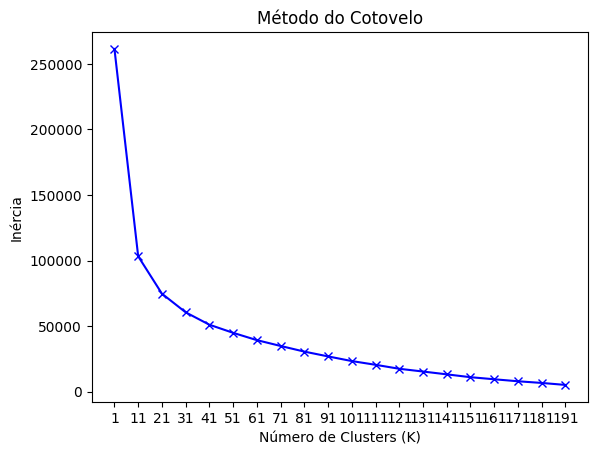

In [277]:
FindViableNClusters(TrainData, range(1, 200, 10))

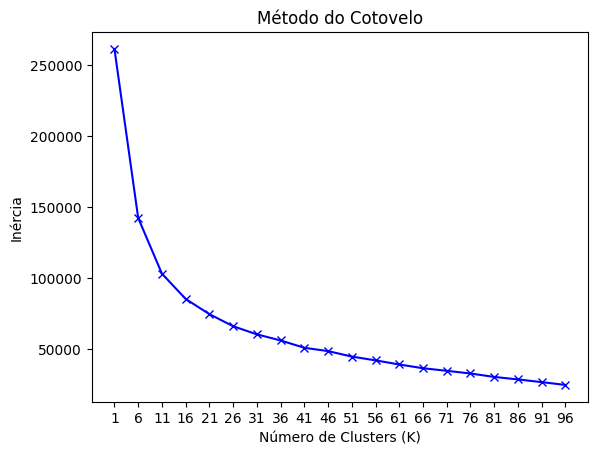

In [278]:
FindViableNClusters(TrainData, range(1, 100, 5))

A análise do gráfico de cotovelo indica que o número ideal de clusters situa-se no intervalo entre 11 e 16. Optamos por utilizar 16 clusters, visando uma maior granularidade na segmentação dos dados sem perder a estabilidade do modelo.

## Analizando matrix de similaridade com a metrica cosine

Utilizamos a matrix de similaridade para indentificar clusters muito isolados

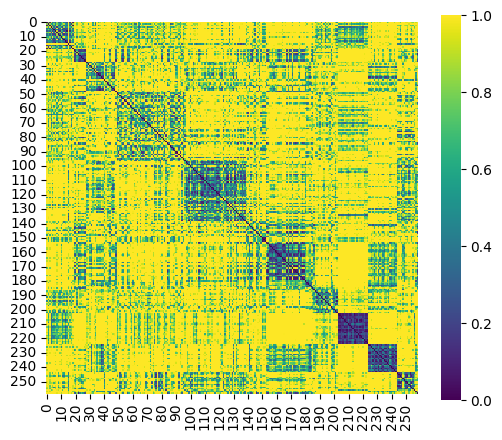

In [279]:
PlotSimilarityMatrix(fullData, cosine_distances)

Com isso podemos perceber que o cluster dos Pandas Vermelhos (redpanda) e dos Tigres (tiger) possuem caracteristicas que os separam dos demais mesmo para um conjunto pequeno de componenetes de autovetores do PCA. Isso se dá pelas imagens muito semelhantes no conjunto de dados e caracteristicas muito especificas que os separam dos demais. Uma possivel solução seria a variação do conjunto de dados de treino, visto que isso forçaria o modelo a adotar caracteristicas mais genericas como mais importantes durante a extração dos $qntPca$ componentes mais importantes.

## Análise do Dendrograma com Similaridade de Cosseno

Através do dendrograma, identificamos a posição relativa do perfil humano em um agrupamento hierárquico baseado na métrica de cosseno. Os resultados demonstram que o modelo identificou uma alta similaridade entre o grupo humano e os clusters compostos por lhamas e leões.

Recomenda-se selecionar a opção "Abrir imagem em uma nova guia" na interface gerada pelo clique do botão direito na imagem.

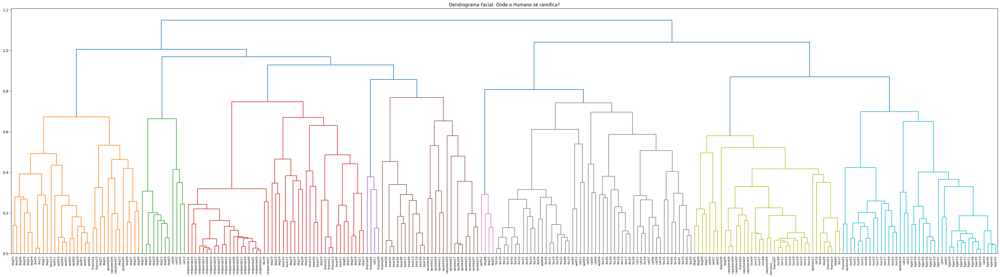

In [280]:
Z = linkage(fullData, method="average", metric="cosine")

plt.figure(figsize=(48,12))
dendrogram(Z, labels=fullNames, leaf_rotation=90, leaf_font_size=8)
plt.title("Dendrograma Facial: Onde o Humano se ramifica?")
plt.show()

## Escolhendo K

Declaramos a variavel n_clusters

In [281]:
n_clusters = 16

## Averiguando consequencia de n_clusters na quantidade de animais por cluster usando KMeans

Com o objetivo de validar se o valor de n_clusters selecionado proporciona uma distribuição equilibrada e coerente dos dados, realizamos um agrupamento utilizando a distância euclidiana. Esta etapa é fundamental para garantir que o modelo não gere clusters excessivamente densos ou subrepresentados. Vale ressaltar que essa metrica não valida por completo o valor de n_clusters, pois o modelo de clustering final se baisea em distribuições Gaussianas, GMM.

In [282]:
kmeans = KMeans(n_clusters=n_clusters, random_state=42).fit(TrainData)
print(np.unique(kmeans.labels_, return_counts=True))

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15],
      dtype=int32), array([ 9, 37, 14, 19, 10, 19, 19, 22, 21, 21, 17,  8, 16, 16,  3,  7]))


# Implementação de Soft Clustering via GMM

Dado que o projeto busca estabelecer correlações entre a morfologia facial humana e animal, optamos pela abordagem de soft clustering. Diferente dos métodos de hard clustering, que impõem fronteiras rígidas, o modelo de Misturas Gaussianas (GMM) permite lidar com a ambiguidade inerente a essas conexões. O GMM modela a densidade dos dados através da sobreposição de múltiplas distribuições gaussianas, o que nos fornece uma métrica de probabilidade de pertinência (semelhança percentual) em vez de uma classificação binária, tornando a análise comparativa muito mais rica e precisa.

## Iniciando GMM

Usamos o GaussianMixture da biblioteca sklearn, com documentação disponível em: https://scikit-learn.org/stable/modules/mixture.html.

Temos os seguintes parametros:
- n_componentes = n_clusters: previamente encontrado

- covariance_type="tied": Impõe que todos os componentes compartilhem a mesma matriz de covariância. Esta escolha é estratégica para dados de alta dimensionalidade, pois reduz a complexidade do modelo e evita o overfitting, garantindo que as elipsoides de densidade tenham o mesmo formato e orientação.(Destaca-se que tanto "tied", como "spherical", possuem a melhor eficacia em casos de alta dimenssão).

- random_state=42: define a random seed, garantido a reproducibilidade e a consistência dos clusters.

- reg_covar=1e-5: é um "seguro" contra erros matemáticos que acontecem quando os dados estão muito próximos ou são insuficientes.

- n_init=10: executa 10 iterações com diferentes pontos de partida e seleciona a que apresenta a maior log-verossimilhança

In [283]:
gmm = GaussianMixture(n_components=n_clusters, covariance_type="tied", random_state=42, reg_covar=1e-5, n_init = 10)
gmm.fit(TrainData)

GaussianMixture(covariance_type='tied', n_components=16, n_init=10,
                random_state=42, reg_covar=1e-05)

## Observando os Clusters

Vamos observar os clusters resultantes do Gaussian Mixture Model!

Faremos uma visualização compactada e outra extensa.

In [284]:
labels_treino = gmm.predict(TrainData.astype(np.float64))
mapeamento = pd.DataFrame({
    'Animal': data_names,
    'Cluster': labels_treino
})

# 3. Ver quem são os "representantes" de cada cluster
for i in range(gmm.n_components):
    integrantes = mapeamento[mapeamento['Cluster'] == i]['Animal'].tolist()
    print(f"\n--- CLUSTER {i} ---")
    print(f"Total de animais: {len(integrantes)}")
    print(f"Exemplos: {integrantes}") # Mostra os 5 primeiros nomes


--- CLUSTER 0 ---
Total de animais: 8
Exemplos: ['quokka02', 'quokka03', 'quokka06', 'quokka07', 'quokka09', 'quokka10', 'quokka15', 'quokka17']

--- CLUSTER 1 ---
Total de animais: 17
Exemplos: ['bear11', 'dog15', 'dog22', 'dog40', 'dog41', 'lhama00', 'lhama01', 'lhama05', 'lhama10', 'lhama11', 'lhama12', 'lhama13', 'quokka04', 'quokka05', 'quokka11', 'quokka12', 'quokka16']

--- CLUSTER 2 ---
Total de animais: 20
Exemplos: ['bear10', 'capybara00', 'capybara02', 'capybara03', 'capybara04', 'capybara05', 'capybara06', 'capybara07', 'capybara08', 'capybara09', 'cat04', 'dog00', 'dog05', 'dog08', 'dog09', 'dog37', 'lhama04', 'lhama08', 'owl01', 'quokka00']

--- CLUSTER 3 ---
Total de animais: 21
Exemplos: ['redpanda00', 'redpanda01', 'redpanda02', 'redpanda03', 'redpanda04', 'redpanda05', 'redpanda06', 'redpanda07', 'redpanda08', 'redpanda09', 'redpanda10', 'redpanda11', 'redpanda12', 'redpanda13', 'redpanda14', 'redpanda15', 'redpanda16', 'redpanda17', 'redpanda18', 'redpanda19', 'redp

### Função para plotagem de imagem em grid

In [286]:
def ShowImages(cluster):
  cluster_animals = mapeamento[mapeamento['Cluster'] == cluster]['Animal'].tolist()
  random.shuffle(cluster_animals) # Shuffle the list of animals
  num_images = len(cluster_animals)

  # Determine grid size (e.g., square or close to square)
  cols = int(np.ceil(np.sqrt(num_images)))
  rows = int(np.ceil(num_images / cols))

  plt.figure(figsize=(cols * 3, rows * 3)) # Adjust figure size dynamically

  for i, name in enumerate(cluster_animals):
    img_path = f"stage2/PROCESSADO_TRATADO_{name}.jpg"
    img = cv2.imread(img_path)
    if img is None:
      img_path = f"stage2/PROCESSADO_TRATADO_{name}.png"
      img = cv2.imread(img_path)

    if img is None:
      img_path = f"stage2/PROCESSADO_TRATADO_{name}.jpeg"
      img = cv2.imread(img_path)

    if img is None:
      print(f"Warning: Image not found at {img_path}")
      continue

    # OpenCV reads as BGR, matplotlib expects RGB
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img_rgb)
    # plt.title(name) # Removed title as requested in previous interaction
    plt.axis('off')

  plt.tight_layout()
  plt.subplots_adjust(wspace=0, hspace=0) # Remove gaps between subplots
  plt.show()

### Clusters: Analise visual

#### Cluster 0

Neste Cluster identificamos 8 quokkas. Caracteristicas observaveis semelhantes entre eles incluem: Orelhas arredontadas, focinho médio, face redonda e sorriso.

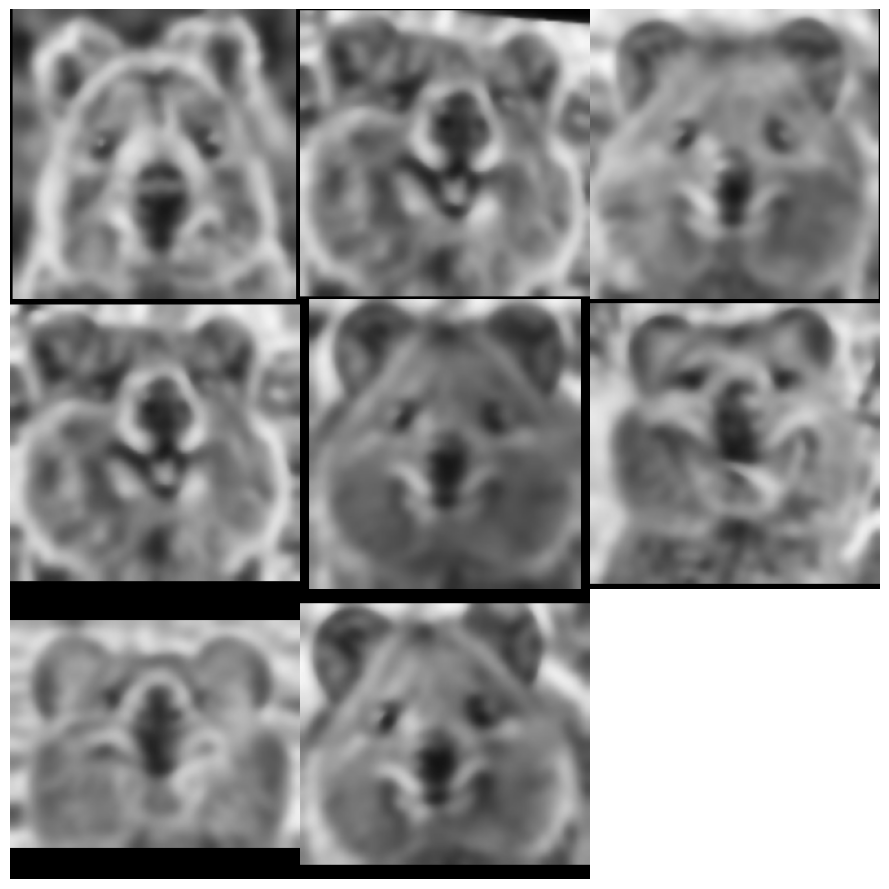

In [303]:
ShowImages(0)

#### Cluster 1

Neste Cluster identificamos 1 urso, 4 cães, 5 quokkas e 7 lhamas. Caracteristicas observaveis semelhantes incluem: focinho em foco, cara engraçada, face levemente arredondada.

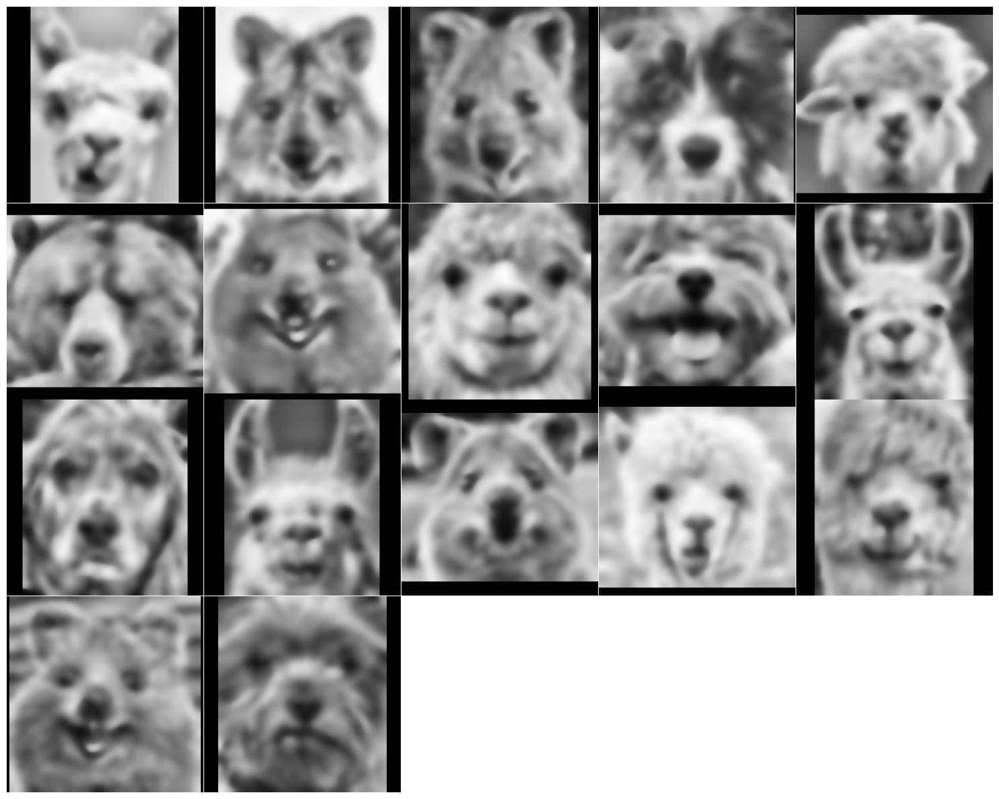

In [304]:
ShowImages(1)

#### Cluster 2

Nesse Cluster identificamos 1 urso, 1 gato, 1 coruja, 1 quokka, 2 lhamas, 5 cães e 9 capivaras. Caracteristicas observaveis semelhantes incluem: focinho e comprido, face comprida.

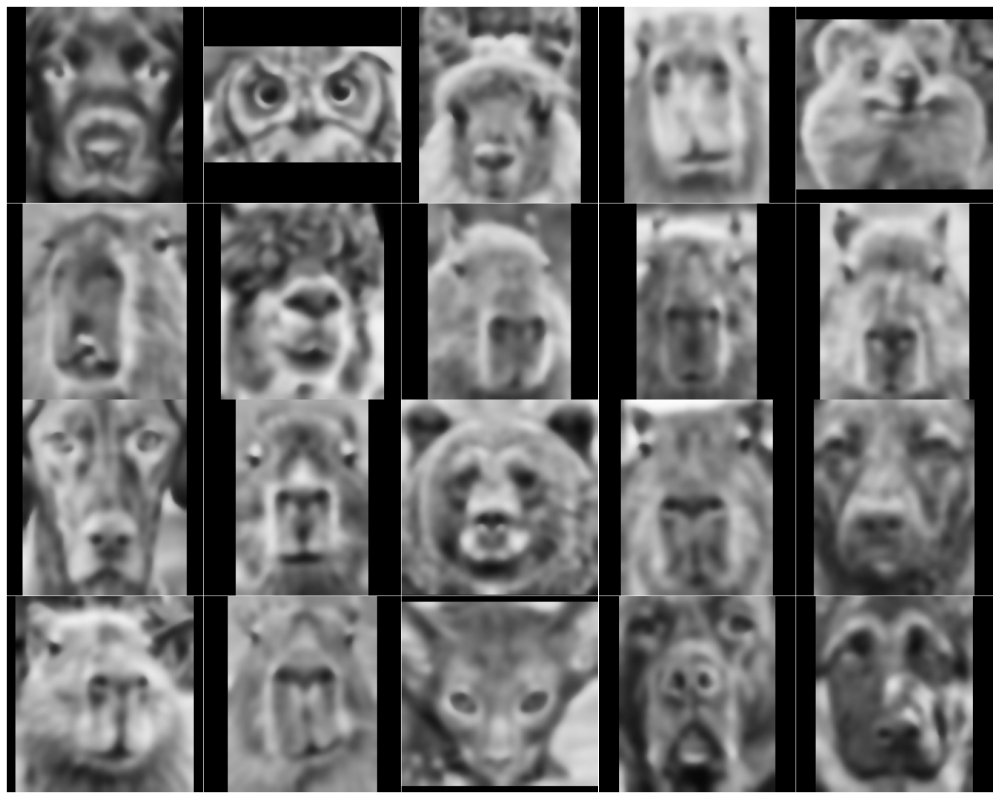

In [305]:
ShowImages(2)

#### Cluster 3

Nesse Cluster identificamos 21 pandas vermelhos. Caracteristicas observaveis incluem: semelhança com pandas vermelhos. É perceptivel que o conjunto de dados usados no clustering possui um componente que destaca os pandas vermelhos do restante. Uma solução para isso seria diminuir a proporção de pandas vermelhos em relação aos demais, isto é, aumentar o repertorio de animais. Vale ressaltar que os pandas vermelhos no geral possuem pouca variancia entre si, diferente dos cães por exemplo.

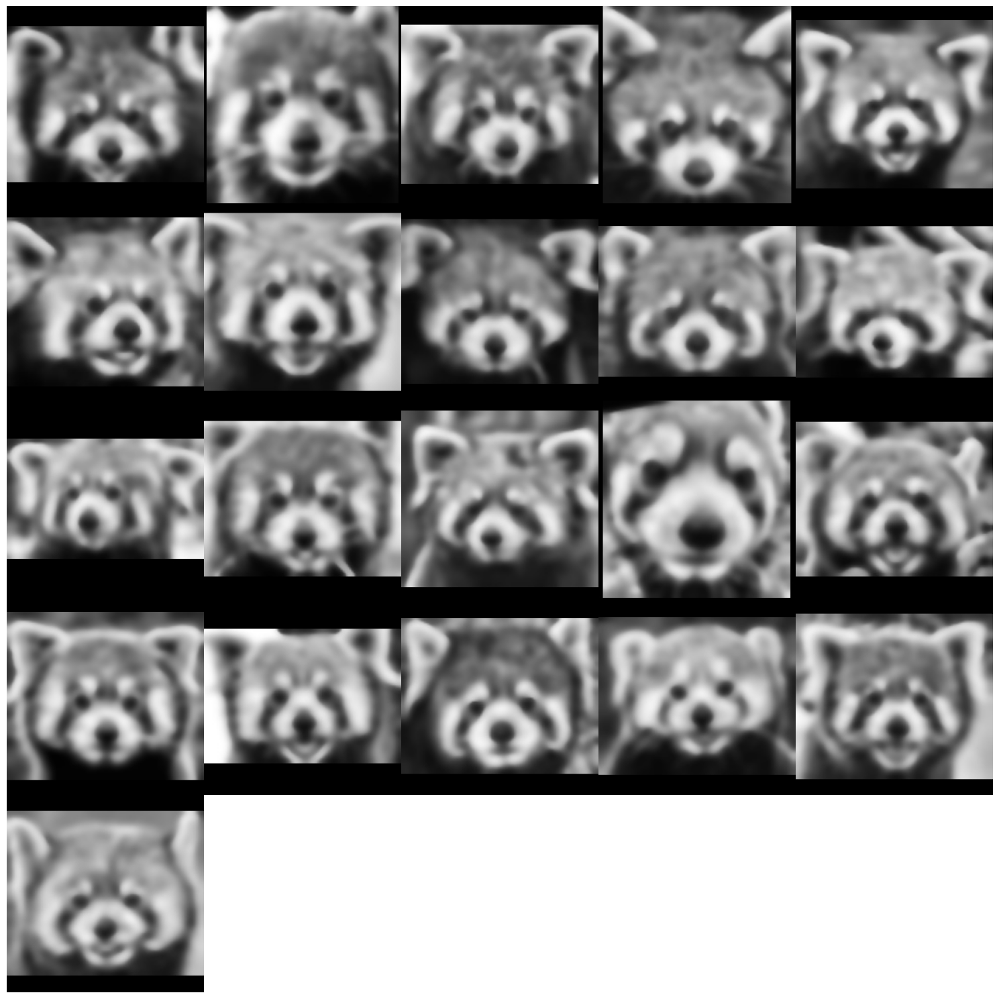

In [306]:
ShowImages(3)

#### Cluster 4

Nesse Cluster identificamos 1 urso, 1 quokka, 2 gatos, 2 cães, 2 lobos e 34 raposas. Caracteristicas observaveis incluem: Focinho grande e destacado, orelhas pontudas, formato da face em V.

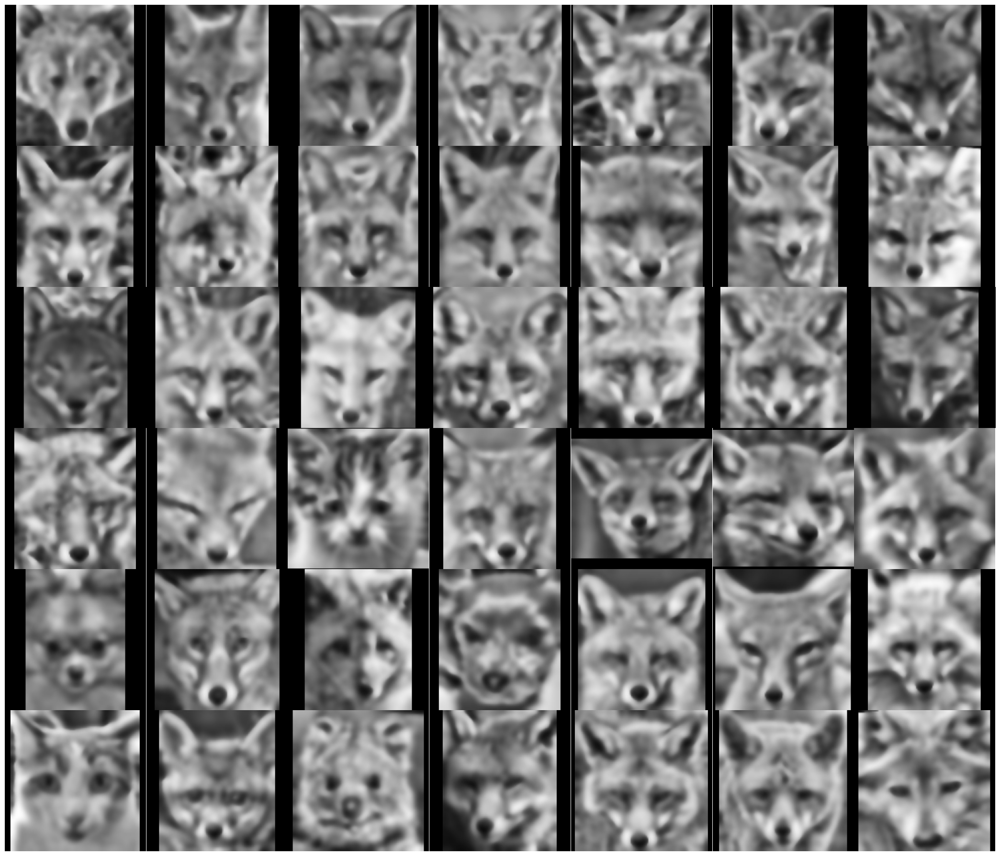

In [307]:
ShowImages(4)

#### Cluster 5

Nesse Cluster identificamos 1 gato e 19 tigres. Caracteristicas observaveis incluem: Pintas. Isso indica que, assim como o panda vermelho (porém de forma mais suave, como visto pela presença de tigres em outros clusters), há um componente que justifica a semelhança com base na posição de certas pintas em certas posições. Vale ressaltar que, com um número de componentes maior, esse problema era aumentado, pois viamos um cluster isolado de tigres juntos com corujas (animais que possuem pintas muito caracteristicas), além de gatos com as mesmas pintas. Comprovamos essa teoria ao inserir uma foto de um humano pintado com pintas de tigre, resultando em uma confiança de 100% no cluster das pintas (tigres com corujas).

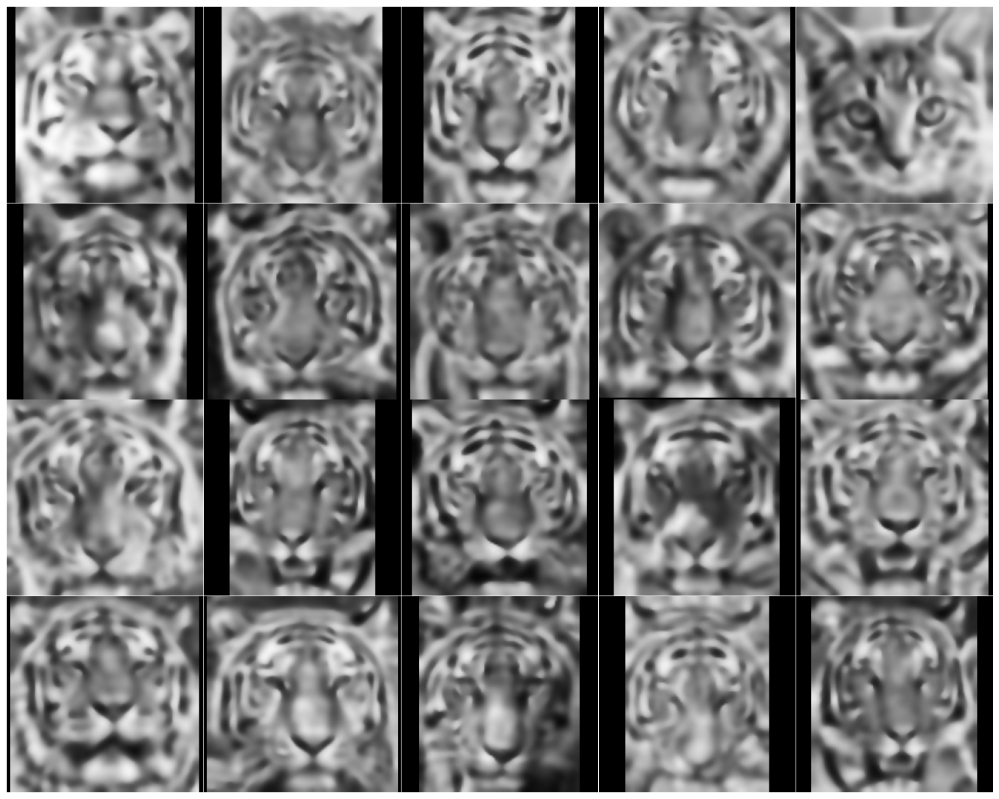

In [308]:
ShowImages(5)

#### Cluster 6

Nesse Cluster identificamos 1 gato, 10 cães. Caracteristicas observaveis semelhantes: Face arredontada e fofa/emburrecida

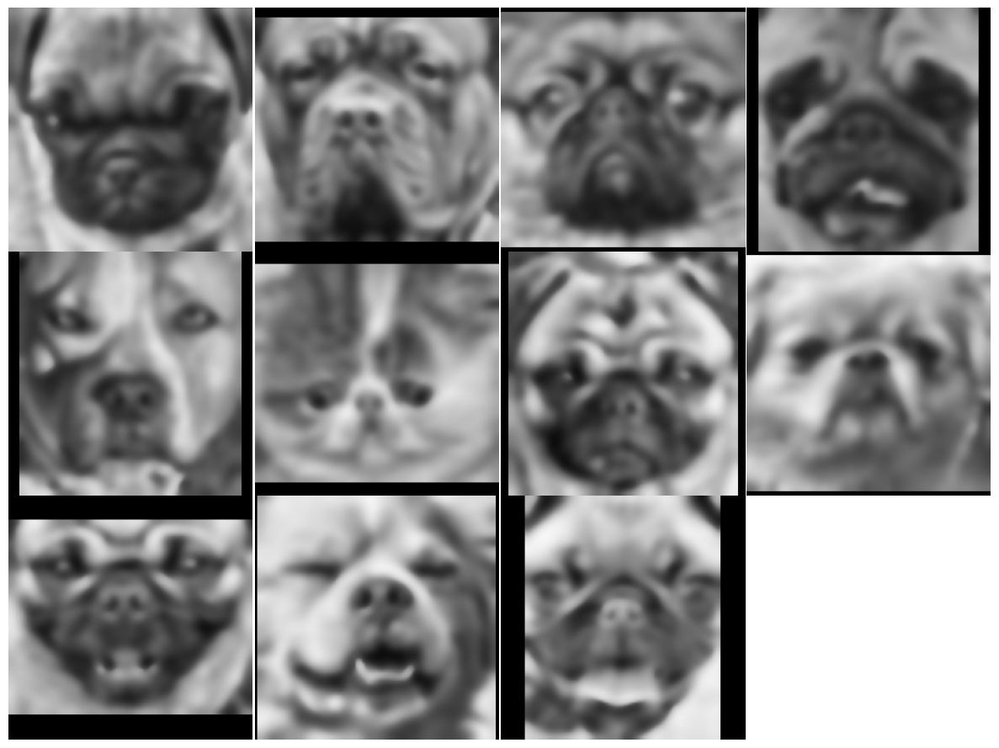

In [309]:
ShowImages(6)

#### Cluster 7

Nesse Cluster identificamos 2 raposas, 4 cães e 8 lobos. Caracteristicas observaveis semelhantes: focinho comprido e destacado, distancia parecida entre os olhos, orelhas pontudas e pequenas.

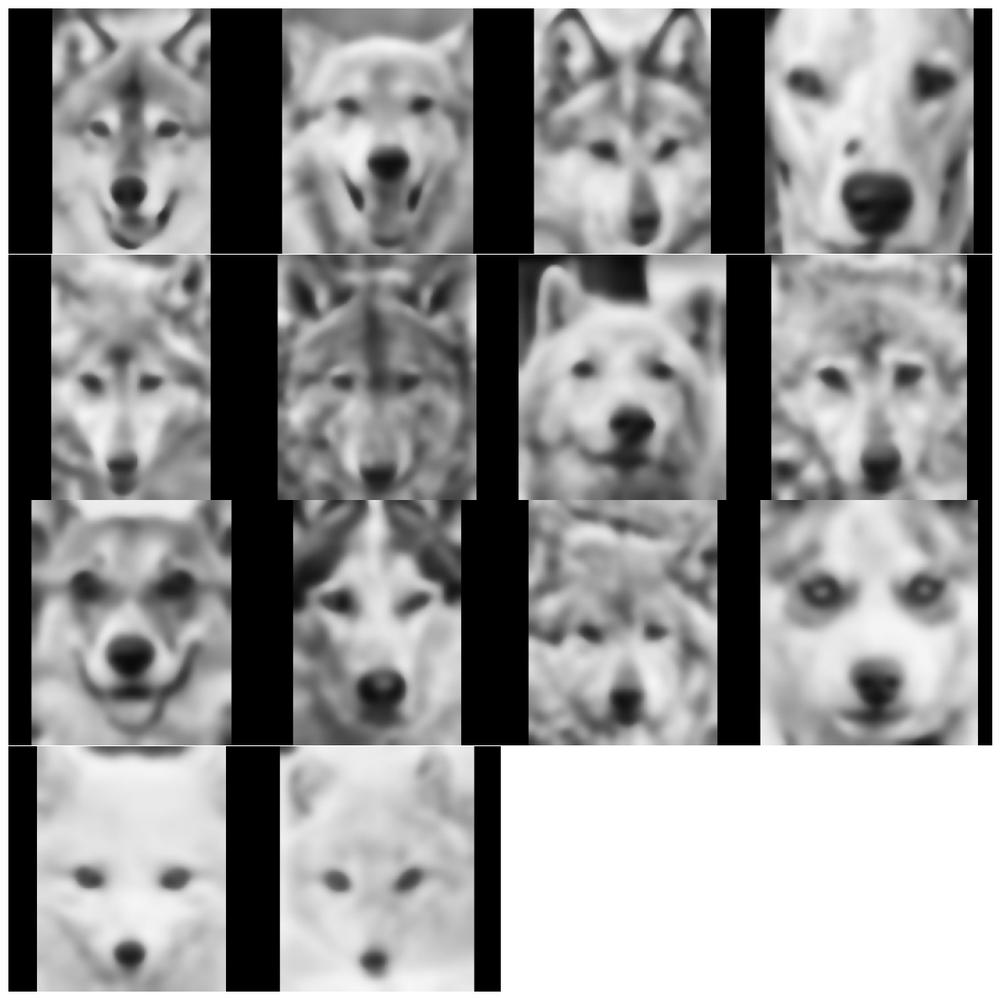

In [310]:
ShowImages(7)

#### Cluster 8

Nesse Cluster identificamos 1 lhama e 13 cães. Caracteristicas observaveis semelhantes: Semelhança com cachorros.

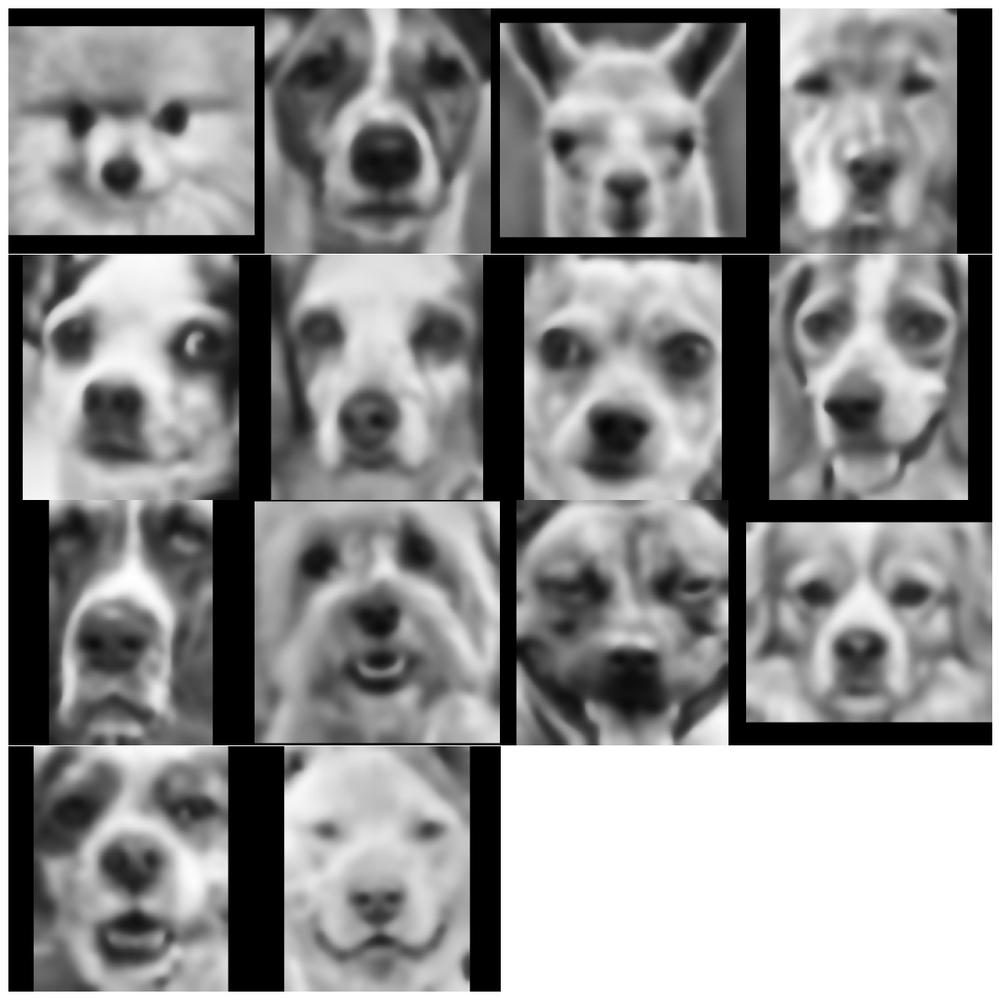

In [311]:
ShowImages(8)

#### Cluster 9

Nesse Cluster identificamos 4 ursos e 7 cães. Caracteristicas observaveis semelhantes: Focinho em destaque (contornado com cores claras/branco), formato redondo do rosto e boca sobressalente.

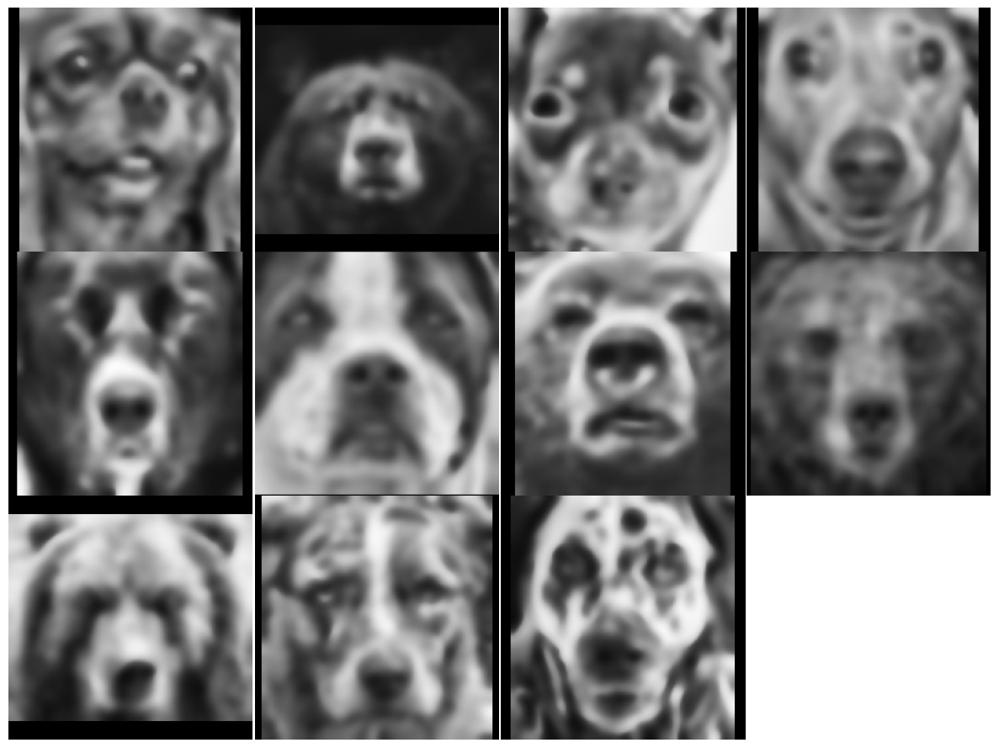

In [312]:
ShowImages(9)

#### Cluster 10

Nesse Cluster identificamos 1 lhama, 1 lobo, 3 raposas e 8 gatos. Caracteristicas observaveis semelhantes: Similaridade com felinos no que tange o formato em V do rosto e formato do queixo (leve definição do queixo)

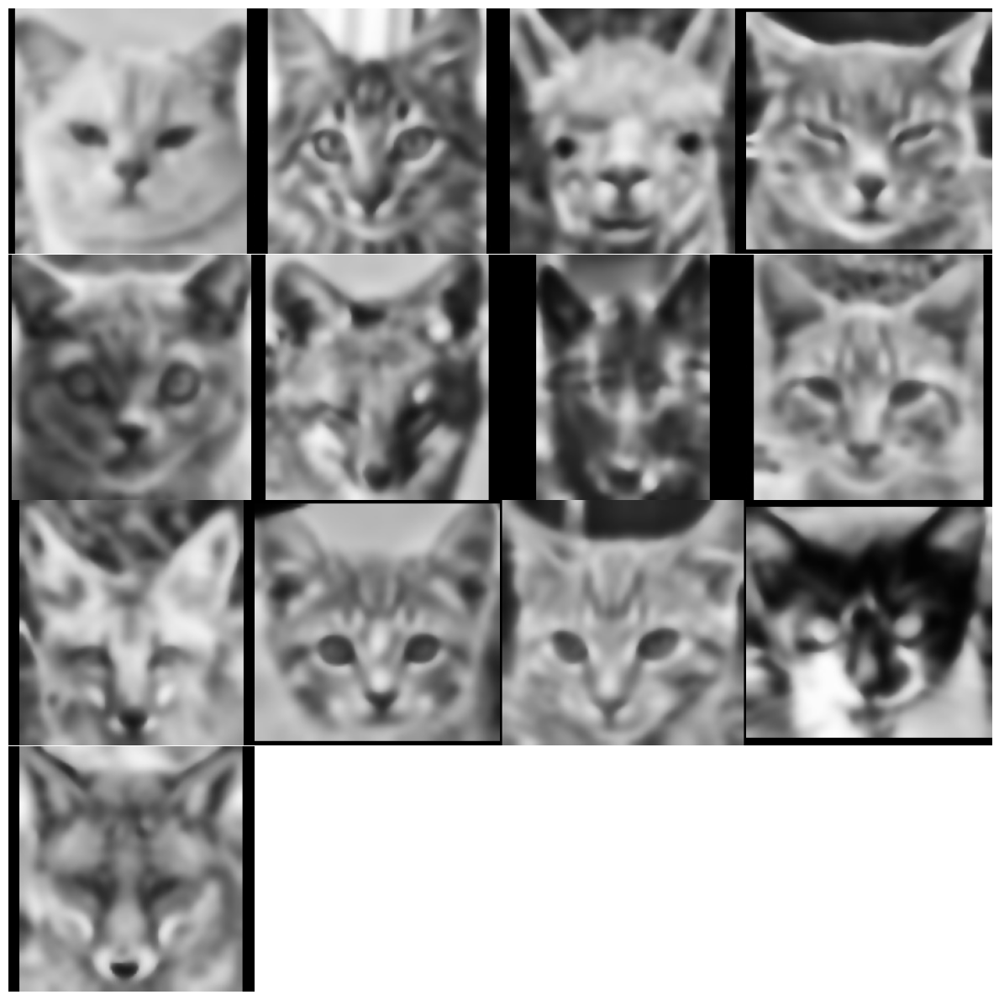

In [313]:
ShowImages(10)

#### Cluster 11

Nesse Cluster identificamos 1 tigre, 2 gatos e 17 leões. Caracteristicas observaveis semelhantes: Clareamento na região da boca, focinho médio com profundidade visivel, narina triangular com conexão (segmento preto) com a boca

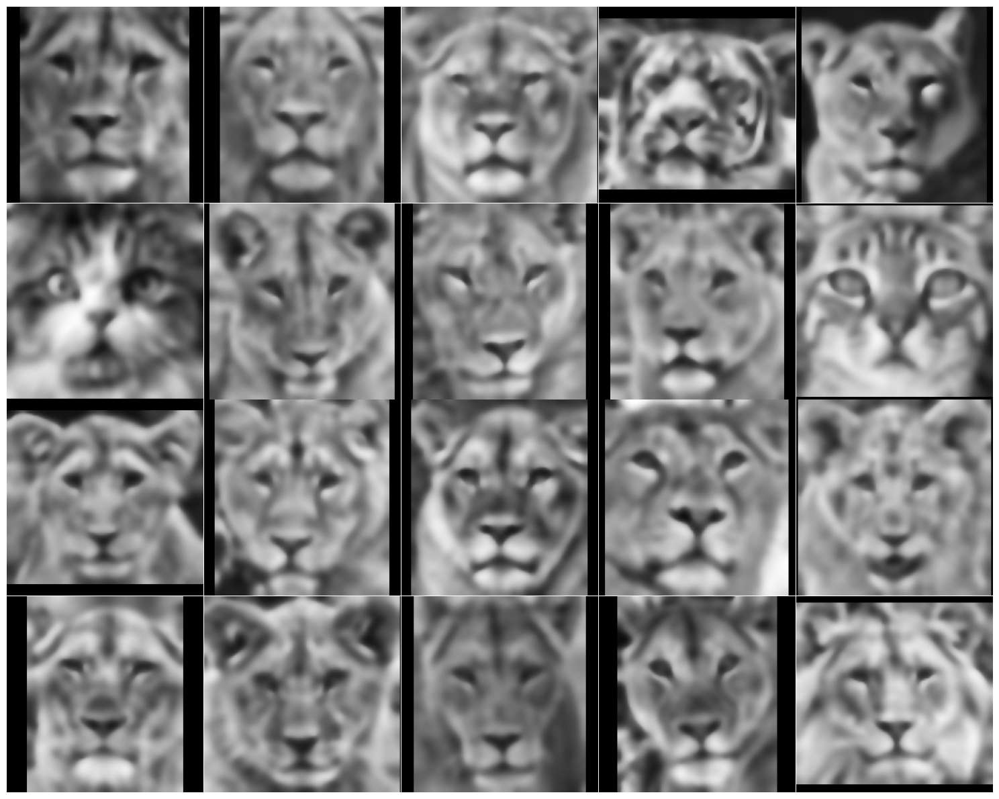

In [314]:
ShowImages(11)

#### Cluster 12

Nesse Cluster identificamos 1 raposa, 3 cães e 3 lobos. Caracteristicas observaveis semelhantes: Linha/segmento contrastante subindo do focinho até a testa, focinho comprido e com narina destacada, orelhas pontudas.

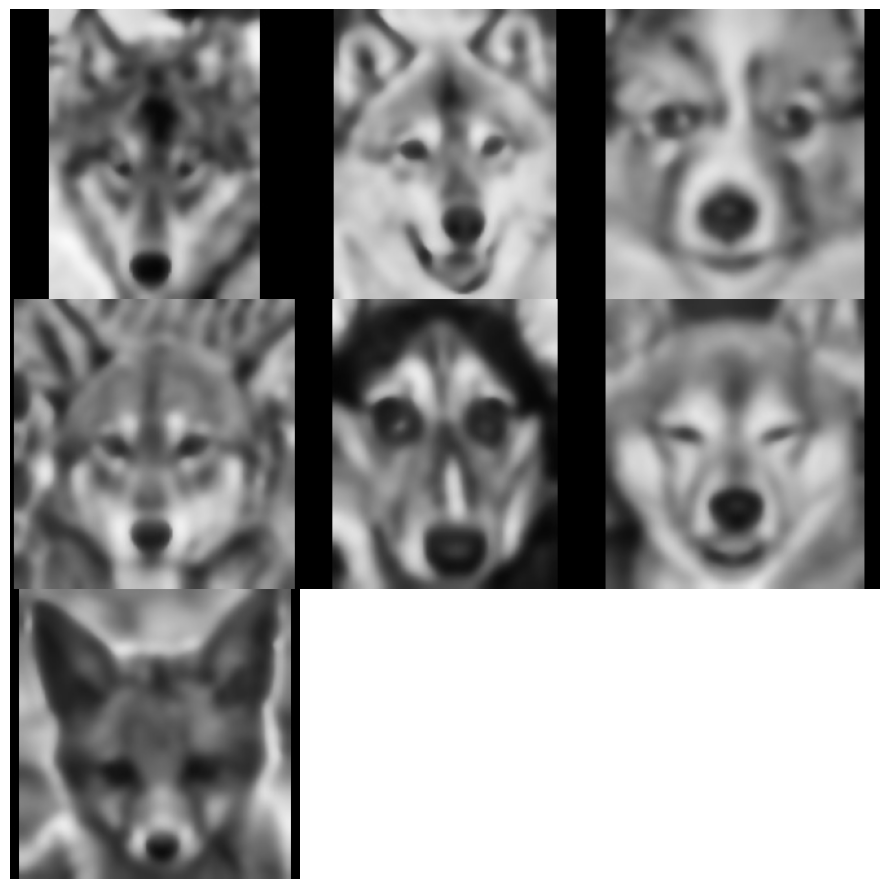

In [315]:
ShowImages(12)

#### Cluster 13

Nesse Cluster identificamos 1 gato e 9 ursos. Caracteristicas observaveis semelhantes: Textura um mais forte se comparada as outras imagens, cara arredondada, focinho comprido, orelhas com interior em destaque e de tamanho mediano.

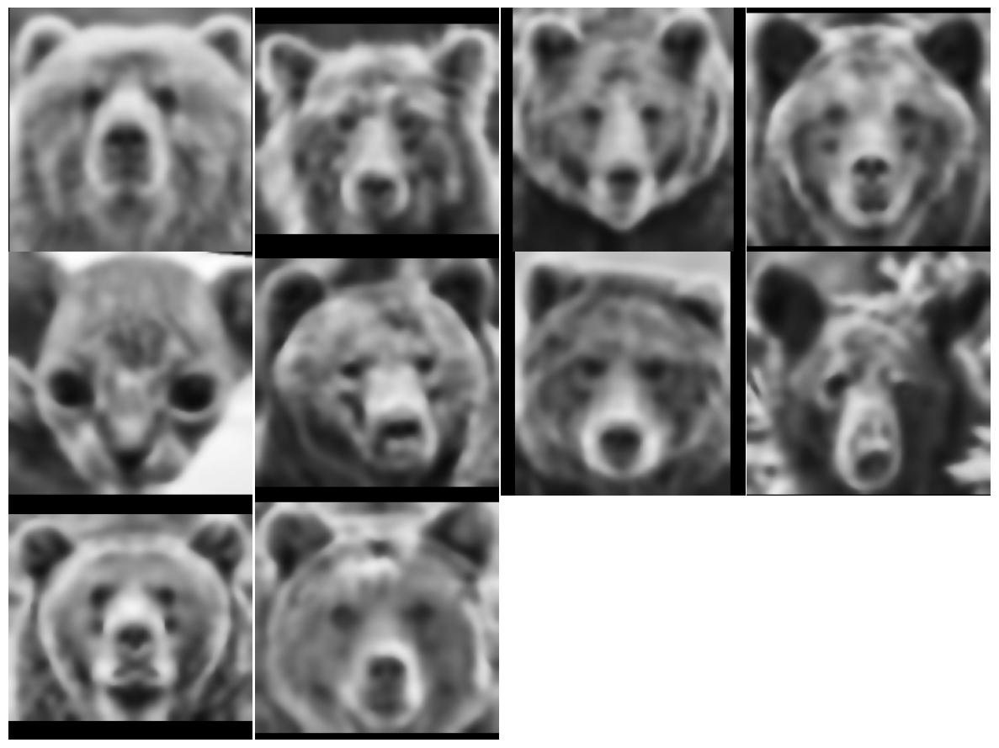

In [316]:
ShowImages(13)

#### Cluster 14

Nesse Cluster identificamos 3 ursos, com a ausência da Cachinhos Dourados. Pouco pode ser dito a respeito desses ursos, apenas que, na visão do algoritmo, eles de fato são muito similhares. Uma justificativa para o isolamento destes, pode estar presente no funto parecido, além da presença de 2 grandes pontos pretos (orelhas) que podem estar sendo lidos pela rede-neural como "olhos", tornando a grande distância entre estes como uma caracteristica única desse conjunto de ursos.

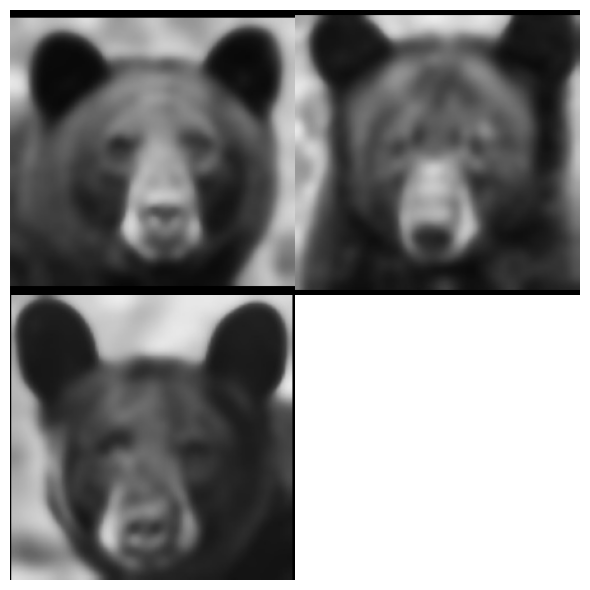

In [317]:
ShowImages(14)

#### Cluster 15

Nesse Cluster identificamos 1 cão, 2 raposas, 3 quokkas, 4 gatos, 4 lhamas, 4 corujas e 9 leões. Caracteristicas observaveis semelhantes: Com excessão dos quokkas, todos remetem a uma expressão facial de Indiferença e intimidação; focinho em destaque, dentre outras informações que somente a rede neural poderia informar. Aparenta ser o conjunto mais disperso

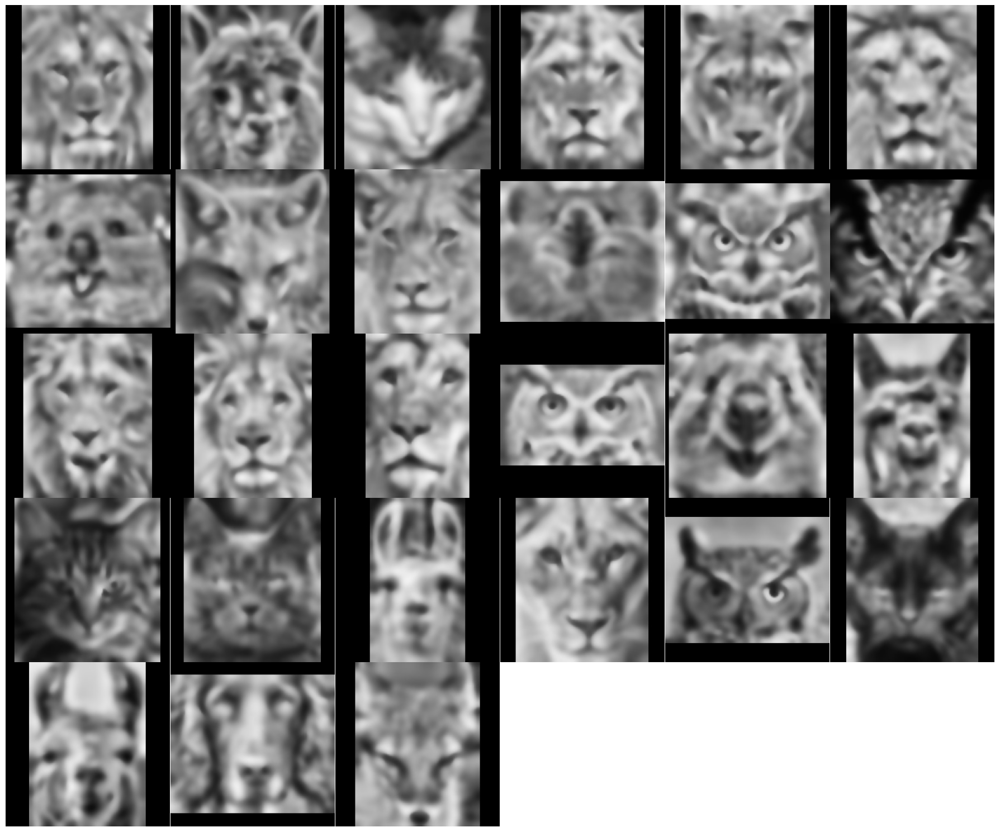

In [318]:
ShowImages(15)

## Previsão do Humano

Para realizar a previsão dos clusters mais semelhantes ao humano, utilizamos da função predict_proba, que retorna probabilidades.

In [319]:
probs_zuzu = gmm.predict_proba(HumanFit)[0]

In [320]:
for i, prob in enumerate(probs_zuzu):
    if prob > 0.01: # Mostrar apenas clusters com mais de 1% de chance
        print(f"Cluster {i}: {prob*100:.2f}%")

Cluster 2: 39.52%
Cluster 15: 60.36%


Para mitigar o risco de sobreconfiança (overconfidence) nas atribuições de clusters, implementamos uma calibração probabilística via Temperatura ($T$). Ao aplicar esse parâmetro nos pesos logarítmicos da log-verossimilhança, conseguimos suavizar a distribuição de probabilidades. Isso evita que o modelo apresente uma certeza artificialmente alta em conexões morfológicas ambíguas.

In [321]:
def getProbabilidadesWithTemperature(Human__):
  # Pegua as densidades de log (em vez das probabilidades prontas)
  log_probs = gmm.score_samples(Human__) # Verossimilhança total
  # O GMM não dá o log por cluster facilmente, então usamos as distâncias ponderadas:
  weighted_log_probs = gmm._estimate_weighted_log_prob(Human__)[0]

  # Aplica uma "Temperatura" (T > 1 suaviza, T < 1 polariza)
  T = 5.0
  exp_probs = np.exp(weighted_log_probs / T)
  return (exp_probs / np.sum(exp_probs)) * 100

In [322]:
porcentagens = getProbabilidadesWithTemperature(HumanFit)

Imprimindo as novas probabilidades:

In [323]:
percs = []
for i, p in enumerate(porcentagens):
    print(f"Cluster {i}: {p:.2f}%")
    percs.append((p, i))

Cluster 0: 0.86%
Cluster 1: 4.82%
Cluster 2: 33.57%
Cluster 3: 0.01%
Cluster 4: 8.15%
Cluster 5: 0.03%
Cluster 6: 0.33%
Cluster 7: 0.10%
Cluster 8: 0.52%
Cluster 9: 2.50%
Cluster 10: 2.48%
Cluster 11: 9.81%
Cluster 12: 0.23%
Cluster 13: 0.06%
Cluster 14: 0.00%
Cluster 15: 36.54%


In [324]:
percs.sort()
percs

[(np.float64(8.966819639529371e-05), 14),
 (np.float64(0.0062901509740792005), 3),
 (np.float64(0.0337323290215812), 5),
 (np.float64(0.06146032132069246), 13),
 (np.float64(0.09558948047997744), 7),
 (np.float64(0.23321358575348047), 12),
 (np.float64(0.33417770526740875), 6),
 (np.float64(0.5234257544559368), 8),
 (np.float64(0.8557510549739513), 0),
 (np.float64(2.480303195873412), 10),
 (np.float64(2.495245613661551), 9),
 (np.float64(4.815423575379557), 1),
 (np.float64(8.151696251297865), 4),
 (np.float64(9.810822224129707), 11),
 (np.float64(33.56765489778853), 2),
 (np.float64(36.53512419142588), 15)]

# Resultados

Imprimimos os 3 Clusters com maior probabilidade.

## Cluster top 1

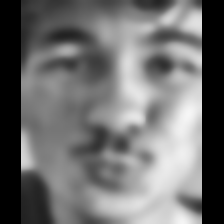

In [325]:
cv2_imshow(imgHuman)

Cluster 15 com 36.54% de semelhança




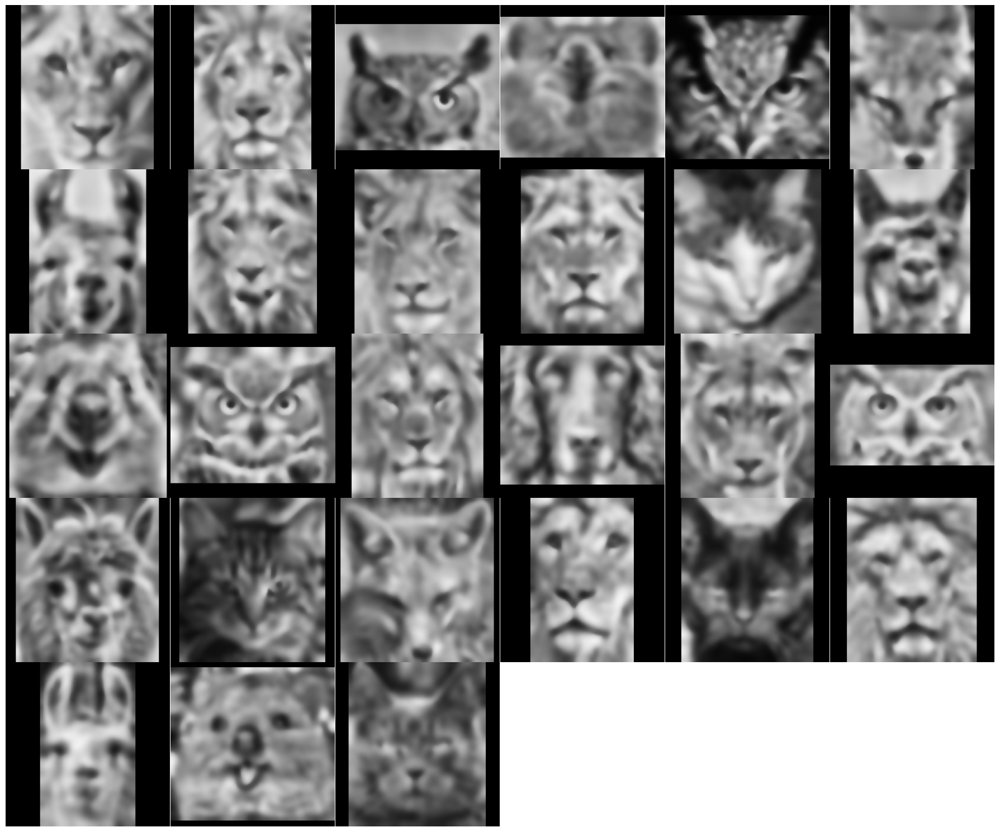

In [326]:
print(f"Cluster {percs[-1][1]} com {percs[-1][0]:.2f}% de semelhança\n\n")
ShowImages(percs[-1][1])

## Cluster top 2

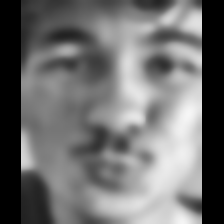

Cluster 2 com 33.57% de semelhança




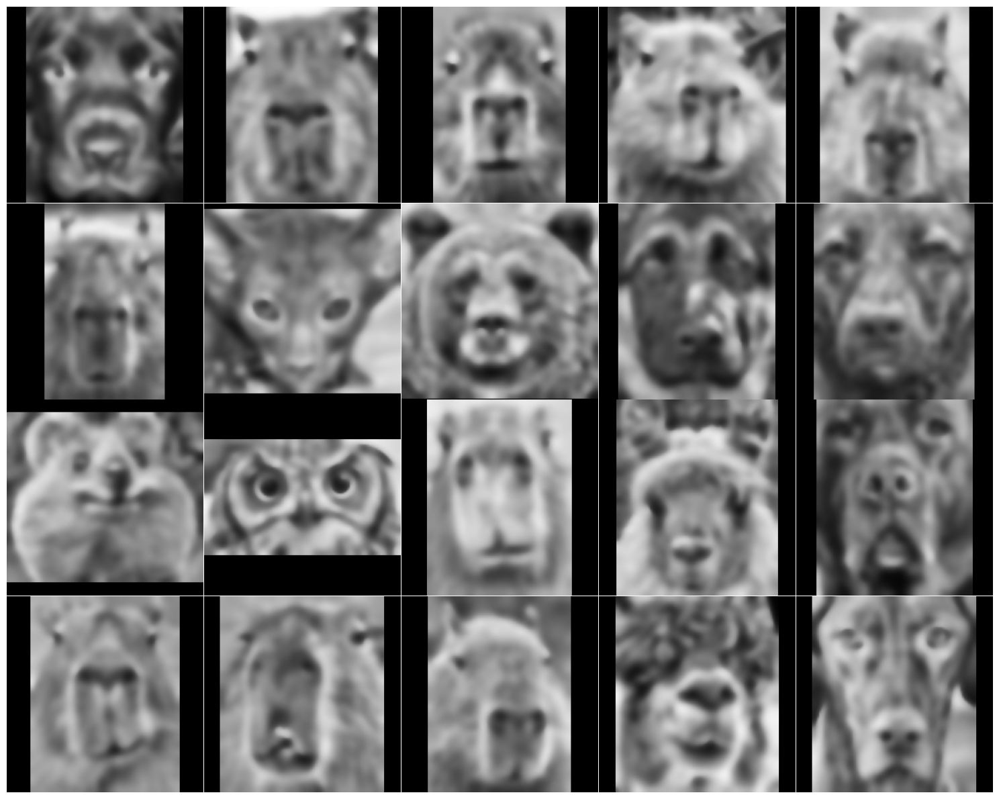

In [327]:
cv2_imshow(imgHuman)
print(f"Cluster {percs[-2][1]} com {percs[-2][0]:.2f}% de semelhança\n\n")
ShowImages(percs[-2][1])

## Cluster top 3

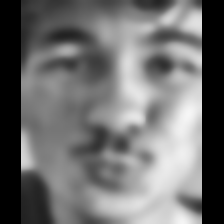

Cluster 11 com 9.81% de semelhança




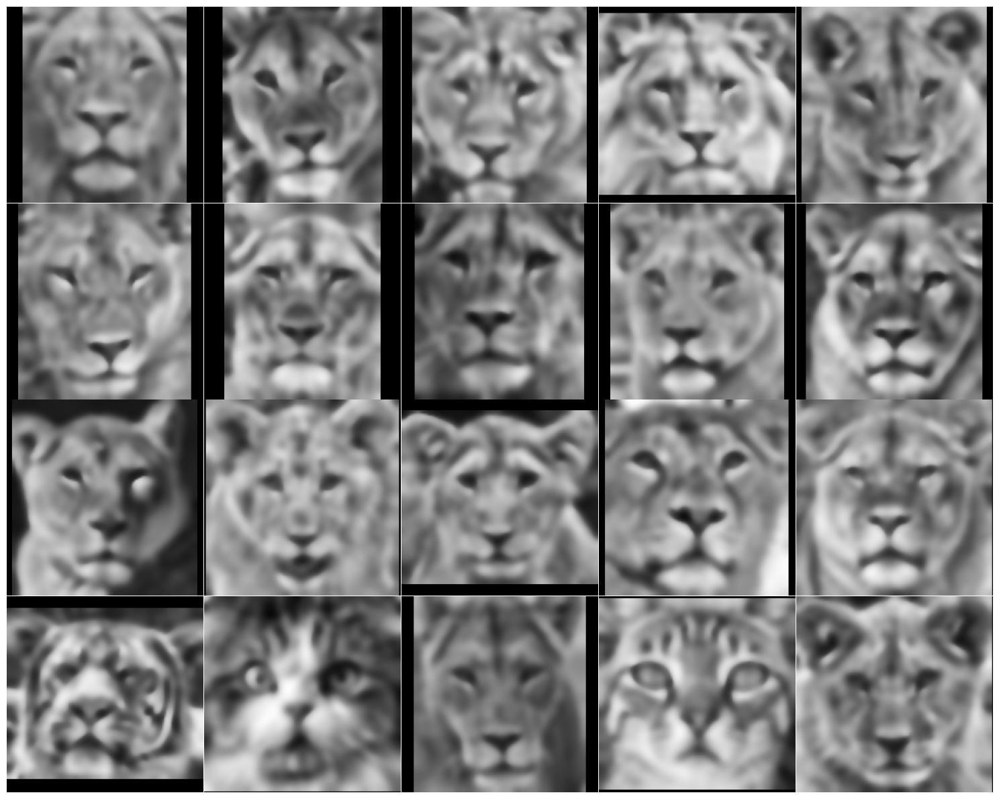

In [328]:
cv2_imshow(imgHuman)
print(f"Cluster {percs[-3][1]} com {percs[-3][0]:.2f}% de semelhança\n\n")
ShowImages(percs[-3][1])

# UMAP


## Configurações e Initialização

O UMAP é uma técnica de redução de dimensionalidade que "projeta" dados complexos (como as 2048 características de uma face) para um espaço 3D, preservando a vizinhança. Ele funciona como se esticasse um lençol sobre os dados para entender sua forma real, garantindo que animais parecidos fiquem juntos e grupos distintos fiquem bem separados.

O uso dele é fundamental para a representação gráfica porque, diferente de métodos simples, o UMAP consegue manter tanto os pequenos detalhes (similaridade entre dois gatos) quanto o panorama geral (a distância entre felinos e aves). Isso permite provar visualmente, e não apenas por números, em qual "vizinhança animal" a foto do humano se encaixa.

In [329]:
reducer = umap.UMAP(
    n_neighbors=15,
    min_dist=0.1,
    n_components=3, # Para visualizar em 3D
    metric='cosine',
    random_state=42
)

features_umap = reducer.fit_transform(TrainData)
human_umap = reducer.transform(HumanFit)

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



## Criação do DataFrame

In [330]:
def to_thumbnail_base64(path, size=(64, 64)):
    with Image.open(path) as img:
        img = img.convert("RGB")
        img.thumbnail(size)
        buffer = BytesIO()
        img.save(buffer, format="JPEG", quality=70) # Quality 70 reduz o tamanho da string (otimização)
        return "data:image/jpeg;base64," + base64.b64encode(buffer.getvalue()).decode()

imagens2 = imagens.copy()
imagens2.sort()

df = pd.DataFrame({
    'umap_x': features_umap[:, 0],
    'umap_y': features_umap[:, 1],
    'umap_z': features_umap[:, 2],
    'label': data_names,
    'tipo': ["Animal"] * len(features_umap),
    'Cluster': labels_treino,
    'image_url': [to_thumbnail_base64(p) for p in imagens2]
})

# Adicionando o humano ao DataFrame
df_humano = pd.DataFrame({
    'umap_x': [human_umap[0, 0]],
    'umap_y': [human_umap[0, 1]],
    'umap_z': human_umap[:, 2],
    'label': ['Humano'],
    'tipo': ['Humano'],
    'Cluster': ['Humano'], # Apenas indicativo
    'image_url': [to_thumbnail_base64(imgHumanPath)]
})

df_umap = pd.concat([df, df_humano])
df_umap['id'] = range(len(df_umap))

In [331]:
df_umap

,umap_x,umap_y,umap_z,label,tipo,Cluster,image_url,id
0,-0.703800,11.452407,4.572032,bear00,Animal,14,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",0
1,-0.918921,11.581460,2.840665,bear01,Animal,9,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",1
2,-0.750789,11.406479,4.510030,bear02,Animal,14,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",2
3,-1.315734,11.651505,3.519318,bear03,Animal,9,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",3
4,-0.547867,11.252896,4.382971,bear04,Animal,13,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",4
...,...,...,...,...,...,...,...,...
254,0.070441,12.935852,1.792469,wolf10,Animal,7,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",254
255,0.181032,12.809587,1.321688,wolf11,Animal,7,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",255
256,0.934765,11.987308,1.897392,wolf12,Animal,12,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",256
257,0.107507,10.598110,0.126782,wolf13,Animal,10,"data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQA...",257


In [332]:
probas_gmm =  np.vstack([gmm.predict_proba(TrainData), probs_zuzu.reshape(1,-1)])

In [333]:
# df_umap -> colunas ['umap_x', 'umap_y', 'label', 'tipo', 'image_url', 'id']
# probas_gmm -> matriz (n_amostras, n_clusters) com as saídas do GMM

probas_df = pd.DataFrame(probas_gmm, columns=[f'Cluster {i}' for i in range(probas_gmm.shape[1])])
probas_df['id'] = df_umap['id'].values # ID para ligar os gráficos

## Plotagem do gráfico

In [334]:
from google.colab import output
output.enable_custom_widget_manager()

In [338]:
import plotly.graph_objects as go
import plotly.express as px
import ipywidgets as widgets
from IPython.display import display

# 1. Dicionário de busca rápida
lookup = {
    row['id']: (row['label'], row['image_url'], row['Cluster'])
    for _, row in df_umap.iterrows()
}

# 2. Criando o Gráfico 3D
fig_px = px.scatter_3d(
    df_umap,
    x='umap_x', y='umap_y', z='umap_z',
    color='Cluster',
    symbol='tipo',
    hover_name='label',
    custom_data=['id']
)

fig = go.FigureWidget(fig_px)

fig.update_layout(
    autosize=True,
    width=1800,  # Ajustado para caber ao lado da imagem
    height=800,
    margin=dict(l=0, r=0, t=0, b=0),
    legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
    scene=dict(
        xaxis_title='', yaxis_title='', zaxis_title=''
    )
)

# 4. Widget de saída estilizado para a lateral
output = widgets.HTML(
    value="<div style='border: 2px dashed #ccc; padding: 20px; text-align: center; border-radius: 10px; height: 300px; display: flex; align-items: center; justify-content: center;'><b>Clique em um ponto<br>para ver a foto</b></div>",
    layout=widgets.Layout(width='300px', margin='100px 0 0 20px')
)

# 5. Função de Callback do clock
def show_image(trace, points, state):
    if not points.point_inds:
        return

    i = points.point_inds[0]
    global_id = int(trace.customdata[i][0])
    label, img, cluster = lookup[global_id]

    output.value = f"""
    <div style='text-align:center; font-family: sans-serif; padding: 15px;)'>
        <b style='font-size: 16px;'>{label}</b><br>
        <span style='color: #666;'>{cluster}</span><br>
        <img src='{img}' width='250'; margin-top:10px;'>
    </div>
    """

for trace in fig.data:
    trace.on_click(show_image)

fig.update_layout(clickmode='event')

# 6. Exibição em Lado a Lado (HBox)
layout_final = widgets.HBox([fig, output])
display(layout_final)

    'data': [{'customdata': array([[ 0],
                                   [ 2]…

Foto no caso onde o usuario não queira rodar todo o código:
- Grupo azul claro mais em cima: pandas vermelhos
- Grupo rosa canto inferior direito: tigres

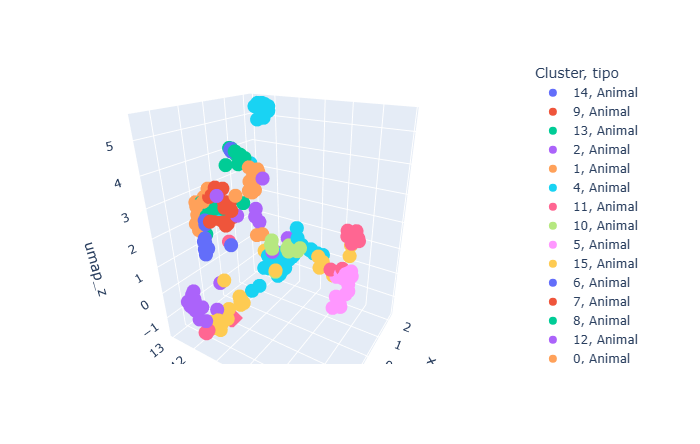

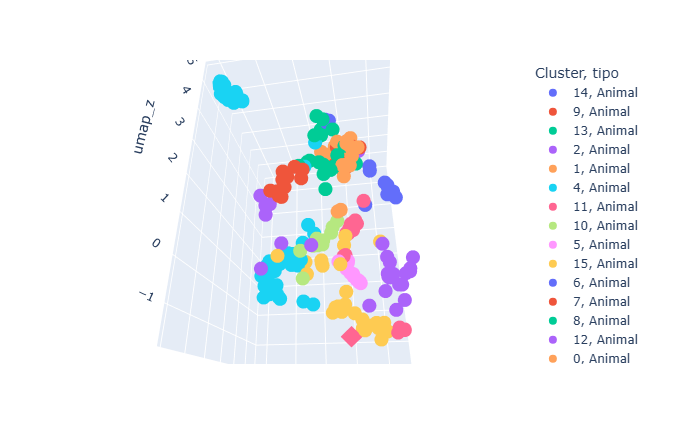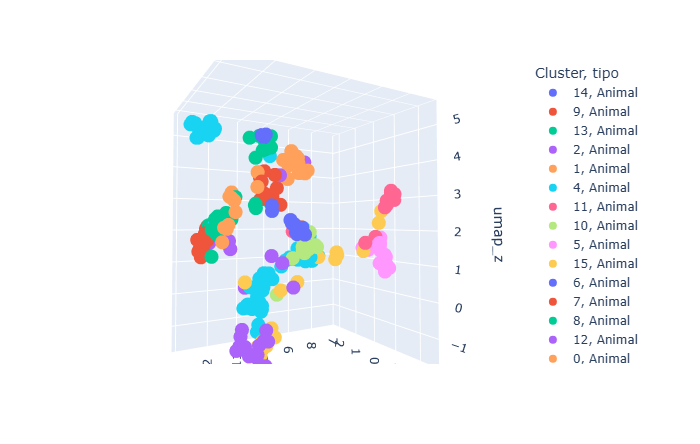

Como podemos ver, há influenciadores/componentes de caracteristicas que possibilitaram a isolação do conjunto dos pandas vermelhos. O mesmo se aplica, ainda que de forma mais moderada, ao conjunto dos tigres.

# Testes com outra imagem

Faremos os testes com outra imagem!

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)
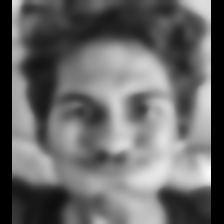

In [341]:
HumanFit2 = ProcessImageStage2("TRATADO_None07.jpg")
HumanFit2

In [342]:
HumanFit2 = cv2.cvtColor(HumanFit2, cv2.COLOR_GRAY2RGB)
HumanFit2 = extrair_embedding(HumanFit2)
HumanFit2 = pca.transform(HumanFit2.reshape(1,-1))
HumanFit2 = HumanFit2[:, :qntPca]

In [343]:
porcentagens2 = getProbabilidadesWithTemperature(HumanFit2)

Probabilidades:

In [344]:
percs2 = []
for i, p in enumerate(porcentagens2):
    print(f"Cluster {i}: {p:.2f}%")
    percs2.append((p, i))
percs2.sort()

Cluster 0: 5.13%
Cluster 1: 10.48%
Cluster 2: 16.30%
Cluster 3: 0.17%
Cluster 4: 9.59%
Cluster 5: 0.14%
Cluster 6: 0.67%
Cluster 7: 0.66%
Cluster 8: 1.47%
Cluster 9: 15.31%
Cluster 10: 10.59%
Cluster 11: 7.78%
Cluster 12: 2.43%
Cluster 13: 4.61%
Cluster 14: 0.03%
Cluster 15: 14.65%


## Cluster Top 1

Cluster 2 com 16.30% de semelhança




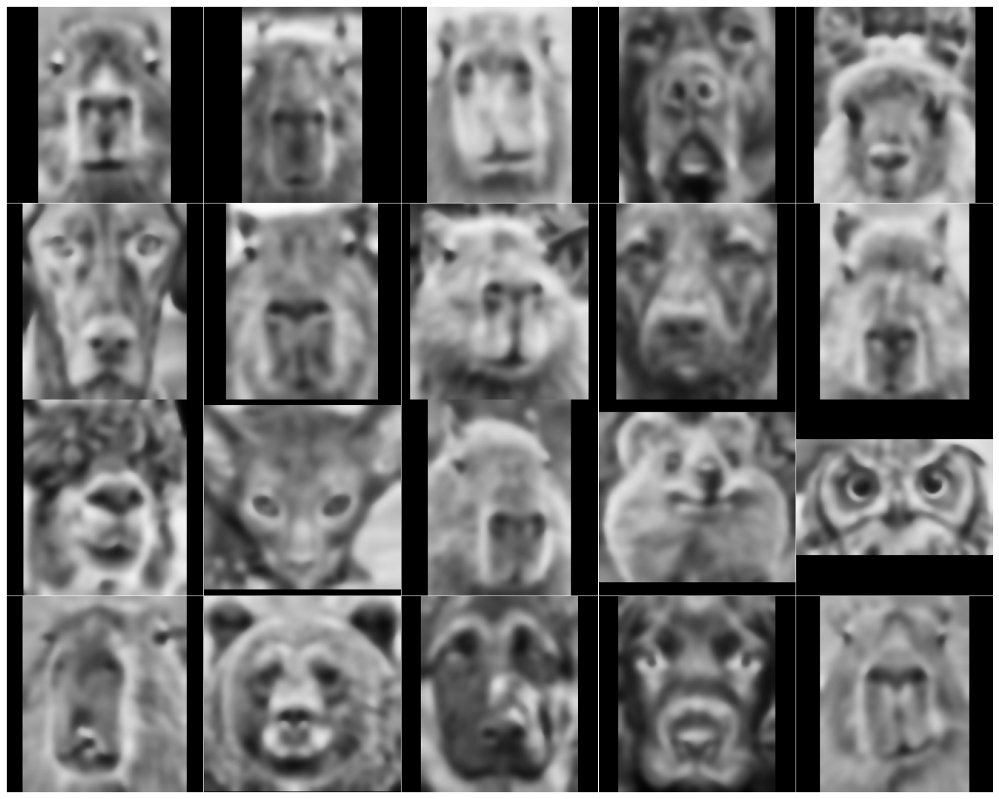

In [345]:
cv2_imshow(HumanFit2)
print(f"Cluster {percs2[-1][1]} com {percs2[-1][0]:.2f}% de semelhança\n\n")
ShowImages(percs2[-1][1])

## Cluster Top 2

Cluster 2 com 16.30% de semelhança




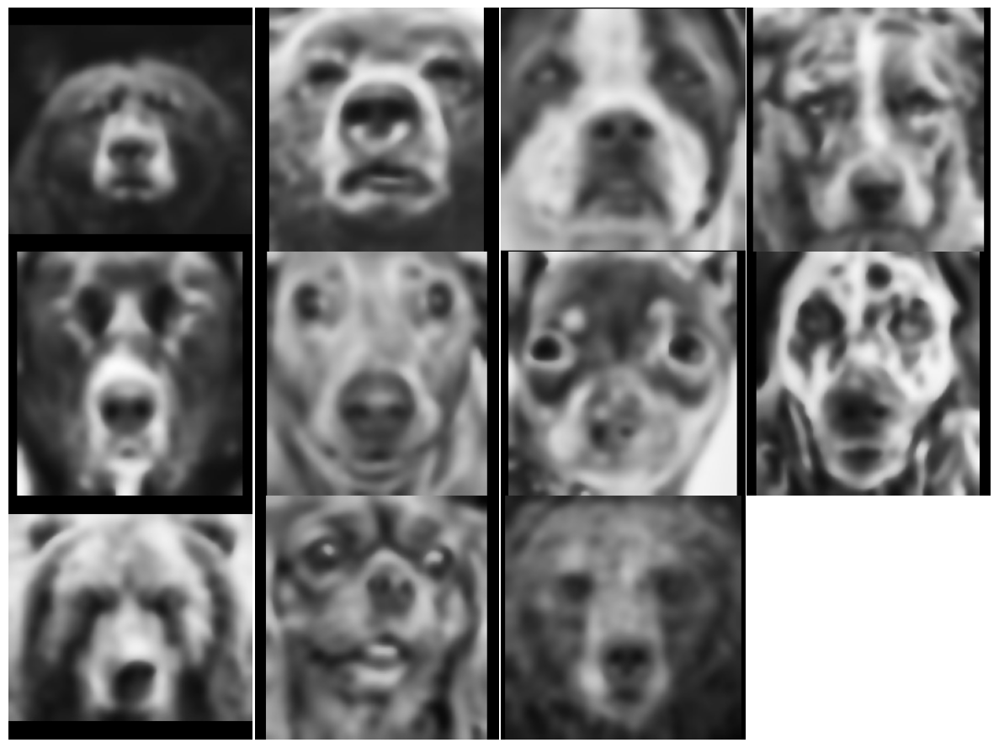

In [346]:
cv2_imshow(HumanFit2)
print(f"Cluster {percs2[-1][1]} com {percs2[-1][0]:.2f}% de semelhança\n\n")
ShowImages(percs2[-2][1])

## Cluster Top 3

Cluster 2 com 16.30% de semelhança




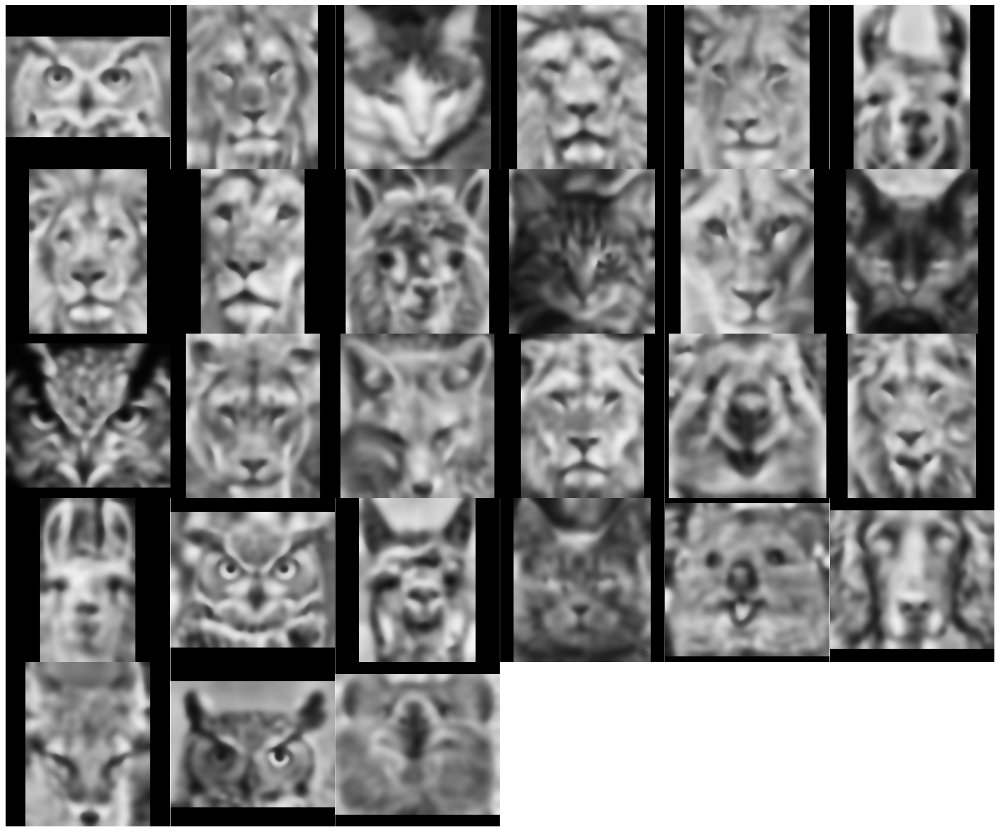

In [347]:
cv2_imshow(HumanFit2)
print(f"Cluster {percs2[-1][1]} com {percs2[-1][0]:.2f}% de semelhança\n\n")
ShowImages(percs2[-3][1])

# Conclusões

Conseguimos resultados bem variados e a tendência é que, com mais dados, o modelo fique ainda mais preciso. O conjunto de treino atual é o nosso limite, mas a versão desktop do código facilita muito essa expansão. No fim das contas, tiramos o GMM do papel e aplicamos as tecnicas que vimos em aula na prática, indo além do básico. Além de dominar esse algoritmo, o projeto foi um baita treino de Redes Neurais, PCA, UMAP e processamento de imagem com o sklearn, ferramentas que a gente com certeza vai usar muito no curso de Machine Learning.

# Complementos

## Github

O software para teste local está disponivel no github: https://github.com/Mateus-AO/AV2-Intro-Dados.

## Visualização dos filtros de imagem

Demonstrando os efeitos dos filtros

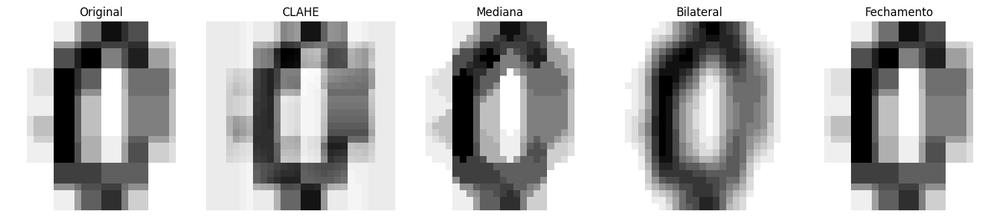

In [348]:
digits = load_digits()
img = digits.images[10].astype(np.uint8)

img_resizer = cv2.resize(img, (28, 28), interpolation=cv2.INTER_AREA)


clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(4, 4))
img_clahe = clahe.apply(img_resizer)

img_median = cv2.medianBlur(img_resizer, 3)

img_bilateral = cv2.bilateralFilter(img_resizer, d=5, sigmaColor=75, sigmaSpace=75)

kernel = np.ones((3,3), np.uint8)
img_morph = cv2.morphologyEx(img_resizer, cv2.MORPH_CLOSE, kernel)

titles = ['Original', 'CLAHE', 'Mediana', 'Bilateral', 'Fechamento']
images = [img_resizer, img_clahe, img_median, img_bilateral, img_morph]

plt.figure(figsize=(15, 5))
for i in range(5):
    plt.subplot(1, 5, i+1)
    plt.imshow(images[i], cmap ='gray_r')
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()

plt.savefig('filtros.png',
            transparent=True,
            dpi=900,
            bbox_inches='tight')


plt.show()


## Visualizando o Gaussian Mixture

Aplicando o Gaussian Mixture em uma, duas e três dimensões

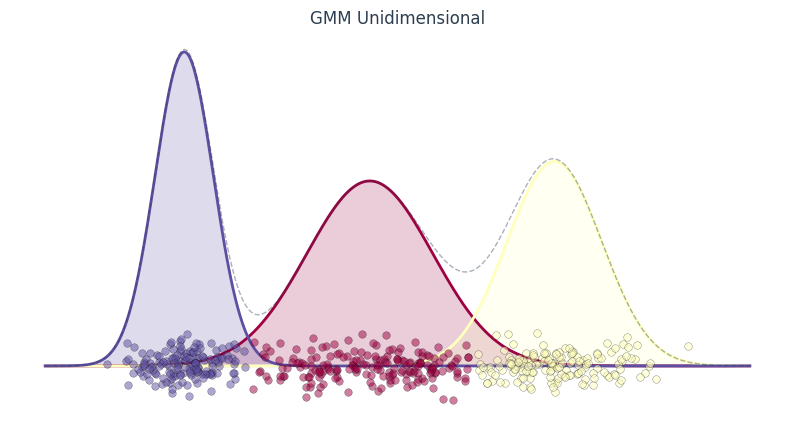

In [349]:
np.random.seed(42)
X = np.concatenate([
    np.random.normal(-2, 0.5, 150),
    np.random.normal(1, 1.2, 200),
    np.random.normal(4, 0.7, 150)
]).reshape(-1, 1)

n_clusters = 3
gmm = GaussianMixture(n_components=n_clusters, random_state=42)
gmm.fit(X)
labels = gmm.predict(X)

x_axis = np.linspace(X.min() - 1, X.max() + 1, 1000).reshape(-1, 1)
pdf = np.exp(gmm.score_samples(x_axis))
responsibilities = gmm.predict_proba(x_axis)
pdf_individual = responsibilities * pdf[:, np.newaxis]

plt.figure(figsize=(10, 5))
cmap = plt.get_cmap('Spectral')

for i in range(n_clusters):
    cor = cmap(i / (n_clusters - 1))

    indices = np.where(labels == i)
    plt.scatter(X[indices], np.random.normal(0, 0.01, size=len(indices[0])),
                color=cor, s=30, alpha=0.5, edgecolor='black', linewidth=0.3, zorder=3)

    plt.fill_between(x_axis.flatten(), 0, pdf_individual[:, i],
                     color=cor, alpha=0.2, zorder=1)
    plt.plot(x_axis, pdf_individual[:, i], color=cor, lw=2, zorder=2)

plt.plot(x_axis, pdf, color='#2c3e50', lw=1, ls='--', alpha=0.4, zorder=2)

plt.axis('off')
plt.title('GMM Unidimensional', color='#2c3e50')

plt.savefig('gmm_1d_transparente.png', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

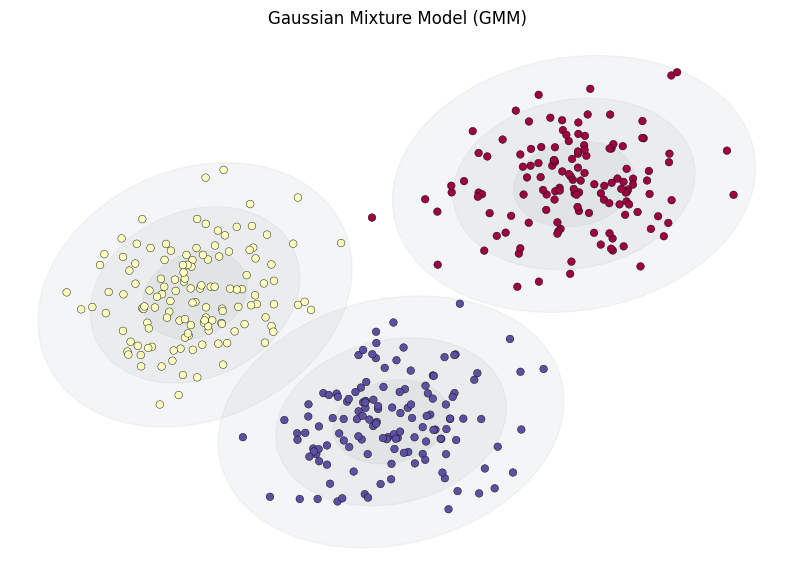

In [350]:
def draw_ellipse(position, covariance, ax=None, **kwargs):
    ax = ax or plt.gca()

    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)

    for nsig in range(1, 4):
        ax.add_patch(patches.Ellipse(xy=position,
                             width=nsig * width,
                             height=nsig * height,
                             angle=angle, **kwargs))

X, y_true = make_blobs(n_samples=400, centers=3, cluster_std=0.60, random_state=0)
rng = np.random.RandomState(11)
X_stretched = np.dot(X, rng.randn(2, 2))

gmm = GaussianMixture(n_components=3, covariance_type='full', random_state=42)
labels = gmm.fit(X_stretched).predict(X_stretched)

plt.figure(figsize=(10, 7))
plt.scatter(X_stretched[:, 0], X_stretched[:, 1],
            c=labels,
            s=30,
            cmap='Spectral',
            edgecolor='black',
            marker='o',
            linewidths=0.3,
            zorder=3)

w_factor = 0.2 / gmm.weights_.max()
for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
    draw_ellipse(pos, covar, alpha=0.08, color='#7f8c8d', zorder=1)

plt.title('Gaussian Mixture Model (GMM)')
plt.axis('off')
plt.savefig('gmm_cluster_transparente.png',
            transparent=True,
            dpi=300,
            bbox_inches='tight')
plt.show()

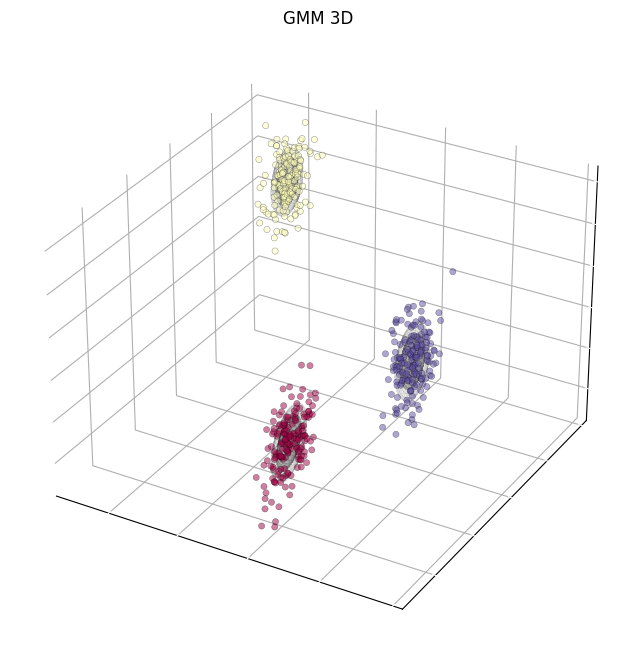

In [351]:
X, y_true = make_blobs(n_samples=500, centers=3, n_features=3, cluster_std=0.60, random_state=0)
rng = np.random.RandomState(11)
X_stretched = np.dot(X, rng.randn(3, 3))

gmm = GaussianMixture(n_components=3, covariance_type='full', random_state=42)
labels = gmm.fit(X_stretched).predict(X_stretched)

def draw_ellipsoid(center, covar, ax, color='grey', alpha=0.3):
    v, w = np.linalg.eigh(covar)
    u = w / np.linalg.norm(w, axis=0)
    radii = np.sqrt(v)

    rx, ry, rz = 1.0, 1.0, 1.0
    u_grid = np.linspace(0.0, 2.0 * np.pi, 30)
    v_grid = np.linspace(0.0, np.pi, 30)

    x = radii[0] * np.outer(np.cos(u_grid), np.sin(v_grid))
    y = radii[1] * np.outer(np.sin(u_grid), np.sin(v_grid))
    z = radii[2] * np.outer(np.ones_like(u_grid), np.cos(v_grid))

    old_shape = x.shape
    nodes = np.array([x.flatten(), y.flatten(), z.flatten()])

    nodes_rotated = np.dot(w, nodes)

    x = nodes_rotated[0, :].reshape(old_shape) + center[0]
    y = nodes_rotated[1, :].reshape(old_shape) + center[1]
    z = nodes_rotated[2, :].reshape(old_shape) + center[2]

    ax.plot_surface(x, y, z, color=color, alpha=alpha, linewidth=0, antialiased=False)


fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(X_stretched[:, 0], X_stretched[:, 1], X_stretched[:, 2],
                     c=labels, s=20, cmap='Spectral', alpha=0.5, edgecolor='black', linewidths=0.3)

for pos, covar in zip(gmm.means_, gmm.covariances_):
    draw_ellipsoid(pos, covar, ax, alpha=0.1)
    draw_ellipsoid(pos, covar * 2, ax, alpha=0.05)

ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))

ax.tick_params(axis='x', colors='white')
ax.tick_params(axis='y', colors='white')
ax.tick_params(axis='z', colors='white')

ax.set_xlabel('', color='white')
ax.set_ylabel('', color='white')
ax.set_zlabel('', color='white')

ax.set_title('GMM 3D')
plt.savefig('gmm_3d.png',
            transparent=True,
            dpi=300,
            bbox_inches='tight')

plt.show()